# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

### **Please read the instructions carefully before starting the project.**
This is a commented Jupyter IPython Notebook file in which all the instructions and tasks to be performed are mentioned.
* Blanks '_______' are provided in the notebook that
needs to be filled with an appropriate code to get the correct result. With every '_______' blank, there is a comment that briefly describes what needs to be filled in the blank space.
* Identify the task to be performed correctly, and only then proceed to write the required code.
* Fill the code wherever asked by the commented lines like "# write your code here" or "# complete the code". Running incomplete code may throw error.
* Please run the codes in a sequential manner from the beginning to avoid any unnecessary errors.
* Add the results/observations (wherever mentioned) derived from the analysis in the presentation and submit the same.


## Importing necessary libraries

In [1]:
#print current env PATH variable value
!printenv PATH

/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin


In [2]:
# f2py, f2py3 and f2py3.10 are installed in '/root/.local/bin' which is not on PATH. Include /root/.local/bin to the existing path environment variable to get rid of installation warnings
%env PATH=/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/root/.local/bin

env: PATH=/opt/bin:/usr/local/nvidia/bin:/usr/local/cuda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/tools/node/bin:/tools/google-cloud-sdk/bin:/root/.local/bin


In [3]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
!pip install scikit-learn==1.2.2 seaborn==0.13.2 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imbalanced-learn==0.10.1 xgboost==2.0.3 -q --user

In [4]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user
# !pip install --upgrade -q threadpoolctl

In [5]:
!pip show scikit-learn

Name: scikit-learn
Version: 1.2.2
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: 
Author-email: 
License: new BSD
Location: /root/.local/lib/python3.11/site-packages
Requires: joblib, numpy, scipy, threadpoolctl
Required-by: bigframes, fastai, imbalanced-learn, librosa, mlxtend, sentence-transformers, shap, sklearn-compat, sklearn-pandas, yellowbrick


**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# To get different performance metrics
import sklearn.metrics as metrics

# To tune model, get different metric scores, and split data
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)
# To help with model building
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression

# To undersample and oversample the data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To do hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV

## Loading the dataset

In [7]:
# import drive from Google Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
creditcard_users = pd.read_csv("/content/drive/My Drive/CreditCardUsers Project/BankChurners.csv")

In [9]:
data = creditcard_users.copy()

## Data Overview

- Observations
- Sanity checks

### Viewing the first and last 5 rows of the dataset

In [10]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [11]:
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189


### Checking the shape of the dataset.

In [12]:
data.shape

(10127, 21)

- The dataset has 10127 rows and 21 columns

### Checking the attribute types

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_



*   There are 15 numerical columns and 6 Object Types
*   Education_Level and Marital_Status have missing values



### Checking the statistical summary

In [14]:
data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,NaN,NaN,NaN,739177606.333663,36903783.450231,708082083.0,713036770.5,717926358.0,773143533.0,828343083.0
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.0,NaN,NaN,NaN,46.32596,8.016814,26.0,41.0,46.0,52.0,73.0
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.0,NaN,NaN,NaN,2.346203,1.298908,0.0,1.0,2.0,3.0,5.0
Education_Level,8608,6,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,9378,3,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.0,NaN,NaN,NaN,35.928409,7.986416,13.0,31.0,36.0,40.0,56.0


### Checking for missing values

In [15]:
data.isna().sum()

,0
CLIENTNUM,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0




*   Education_Level and Marital_Status have missing values




### Checking for duplicate values

In [16]:
data.duplicated().sum()

0

There are no duplicates

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [17]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [18]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [19]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [20]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow",medianprops={'color': 'red', 'linewidth': 2})

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
        medianprops={'color': 'red', 'linewidth': 2}  # Customize median line
    )

    plt.tight_layout()
    plt.show()

#### Univariate Analysis

Numerical Features:
['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


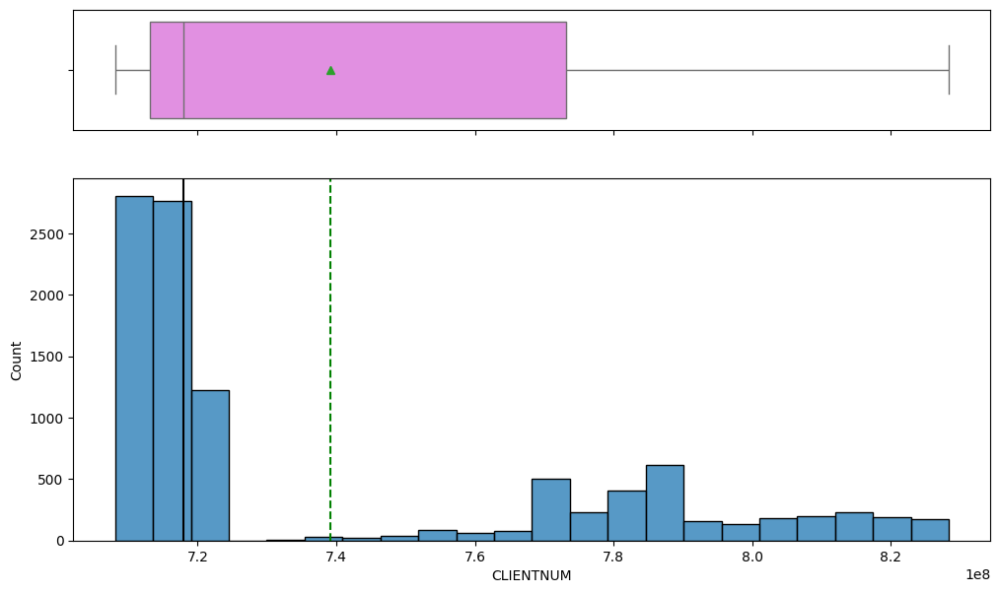

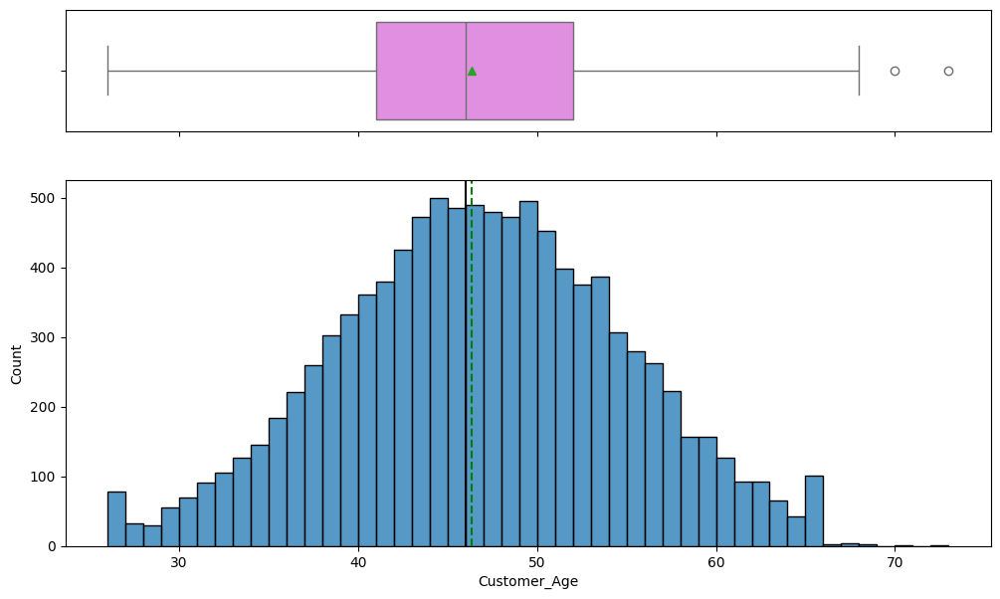

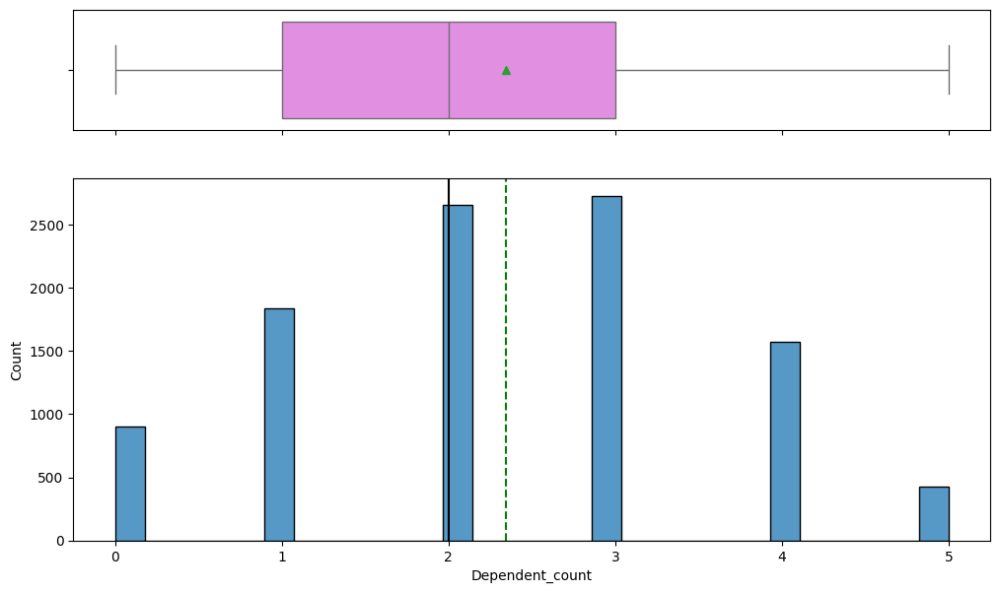

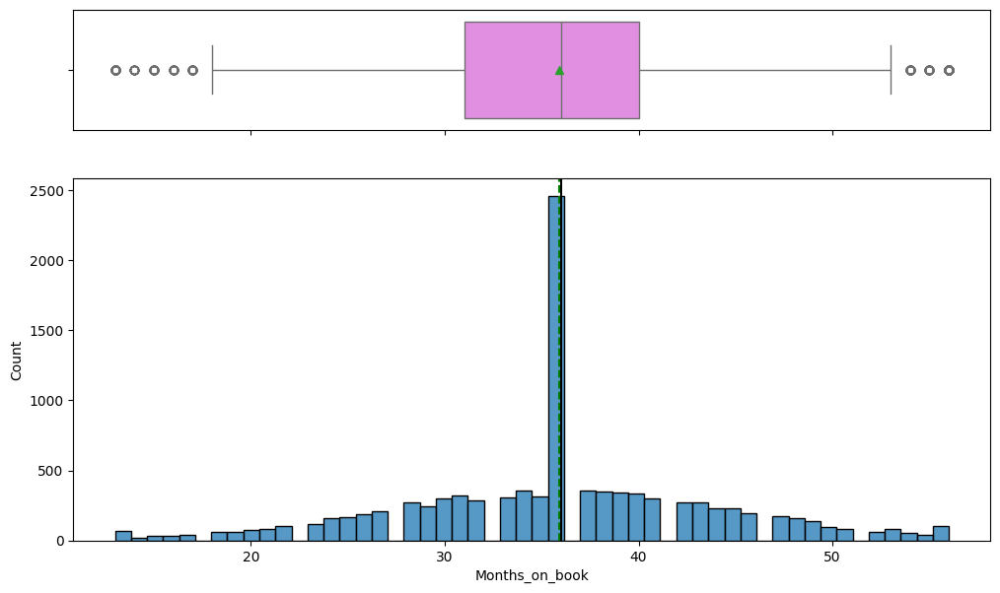

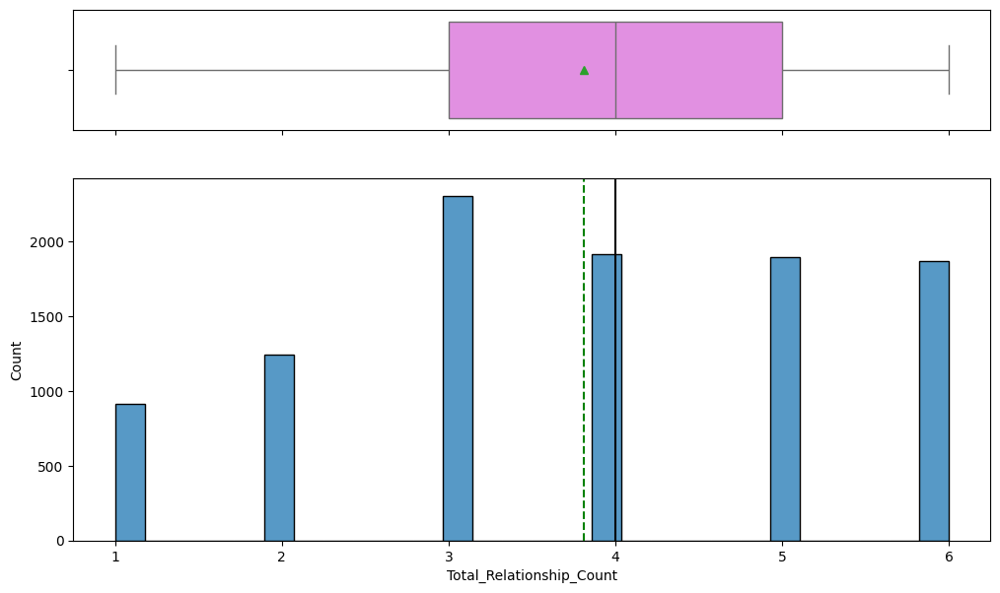

...

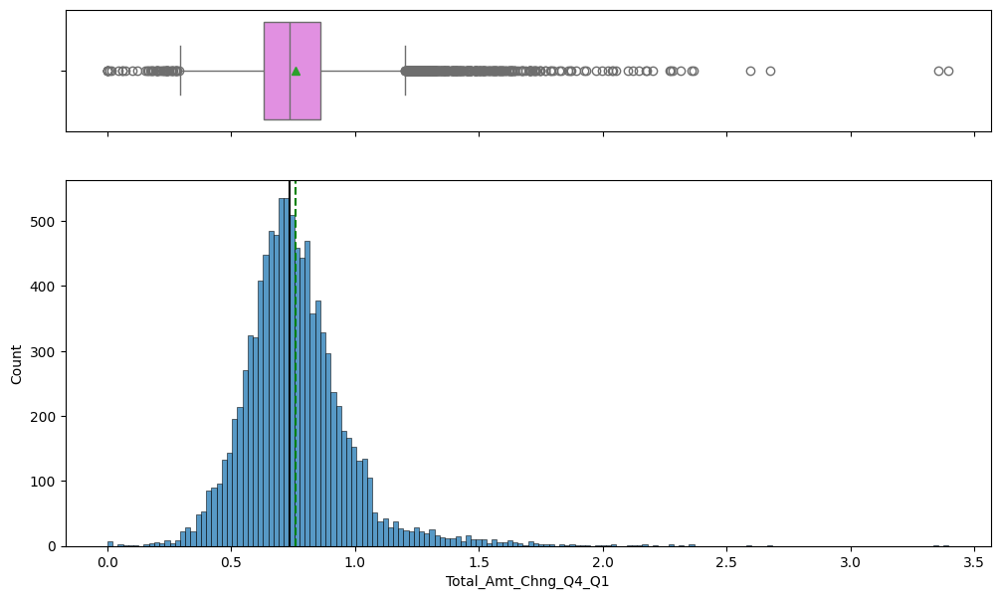

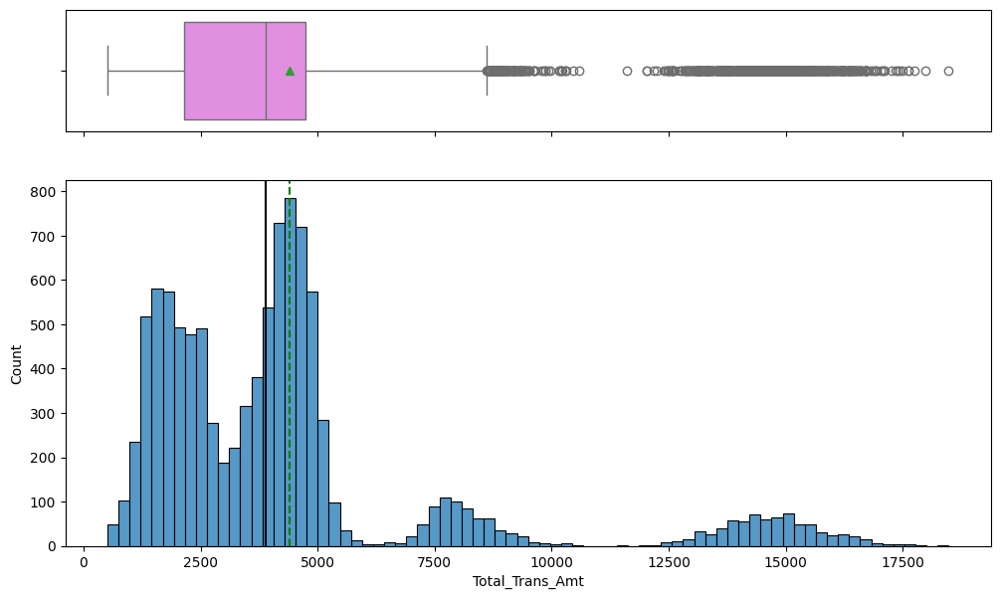

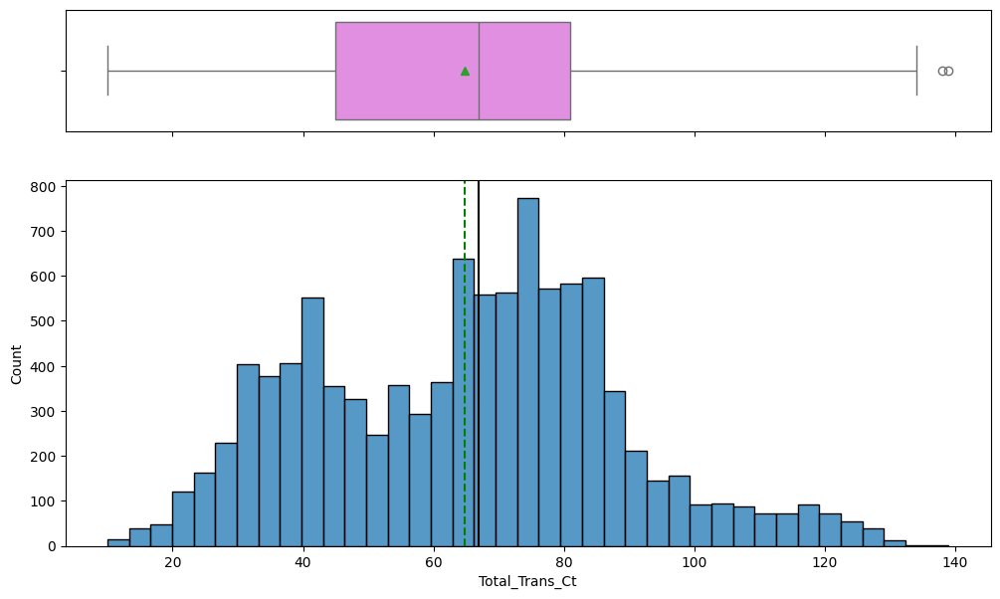

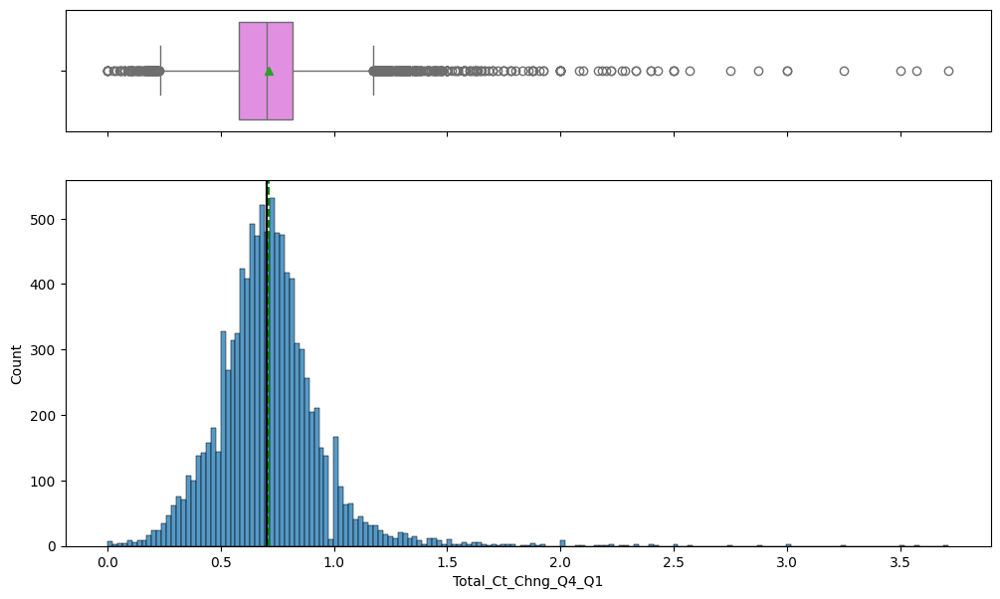

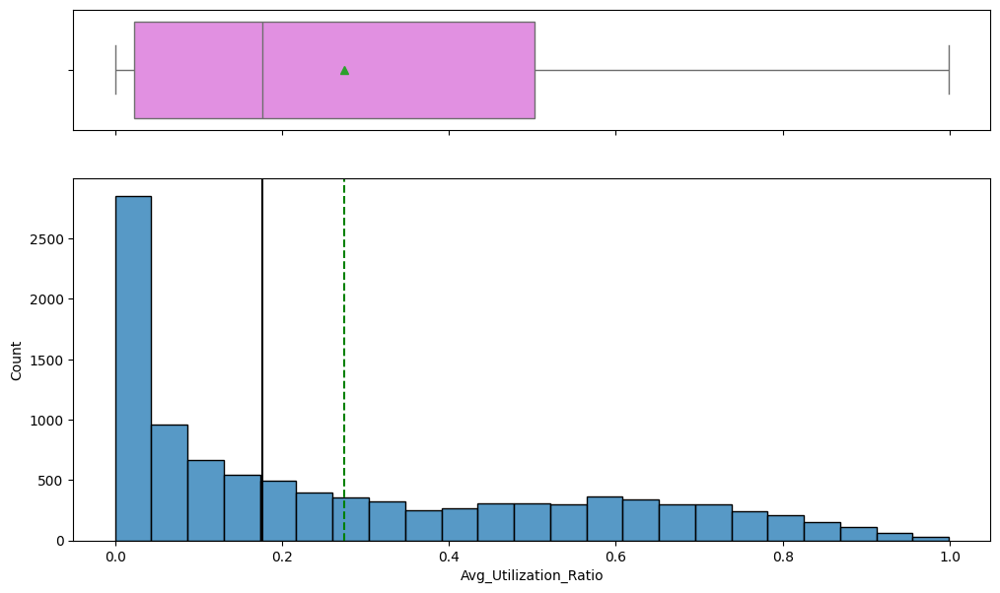

In [21]:
# defining the list of numerical features to plot
features = data.select_dtypes(include=['number']).columns.tolist()

print("Numerical Features:")
print(features)
# creating the histograms
for i, feature in enumerate(features):
    histogram_boxplot(data, feature)    # call the histogram_boxplot function to plot the histogram and boxplot

**Observations on Total Transaction Amount**

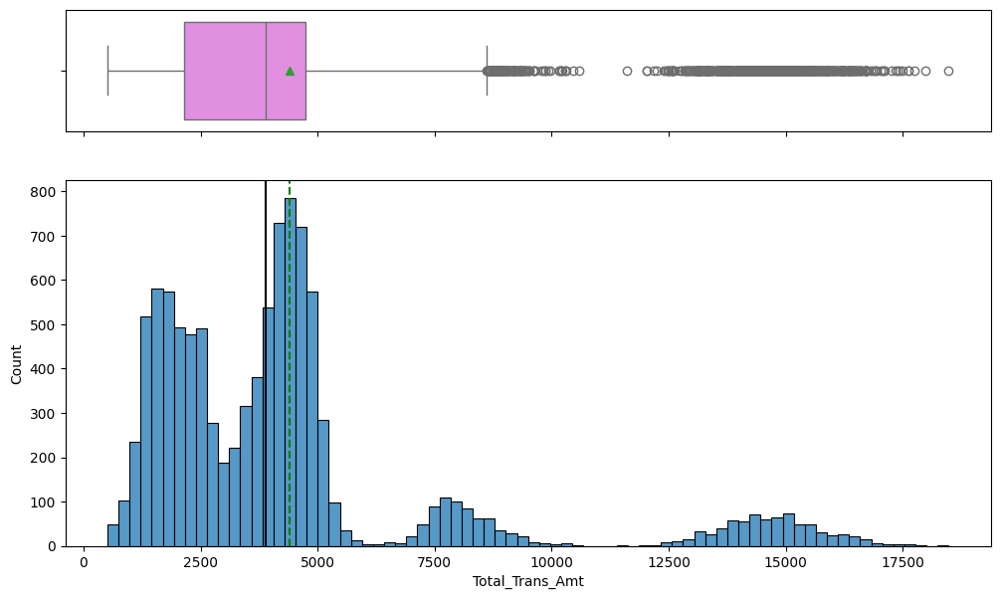

In [22]:
histogram_boxplot(data, 'Total_Trans_Amt')



*   Total_Trans_Amount data is right skewed where the mean is greater than the median




**Observations on Customers Income**

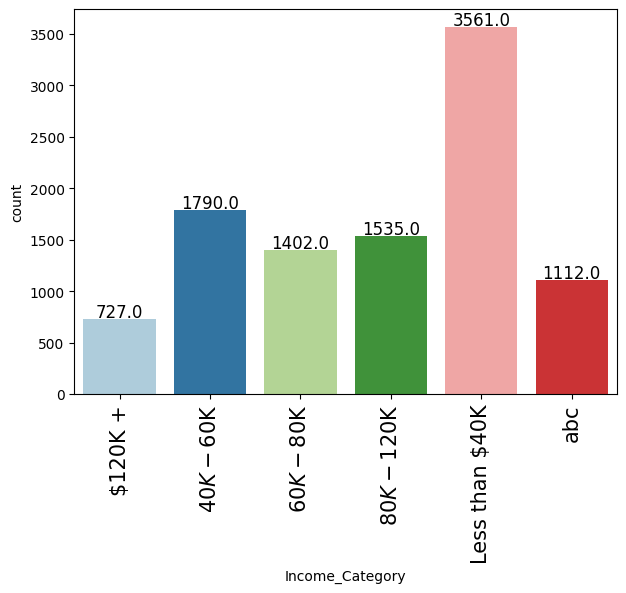

In [23]:
labeled_barplot(data, 'Income_Category')

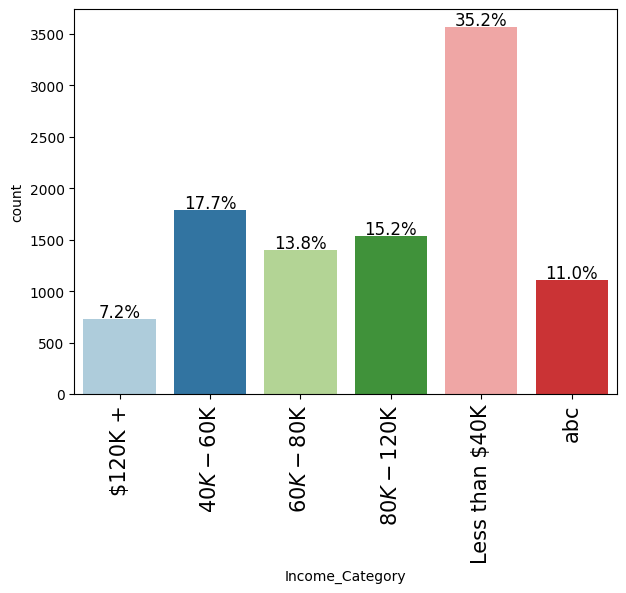

In [24]:
labeled_barplot(data, 'Income_Category', True)

* Customers with less than $40K income are highest - 35.2%


* 40K-60K is next highest income category - 17.7%
* customers with $120K+ income is the least - 7.2%
* abc incorrect income category needs to be corrected

**Observations on Education of customers**

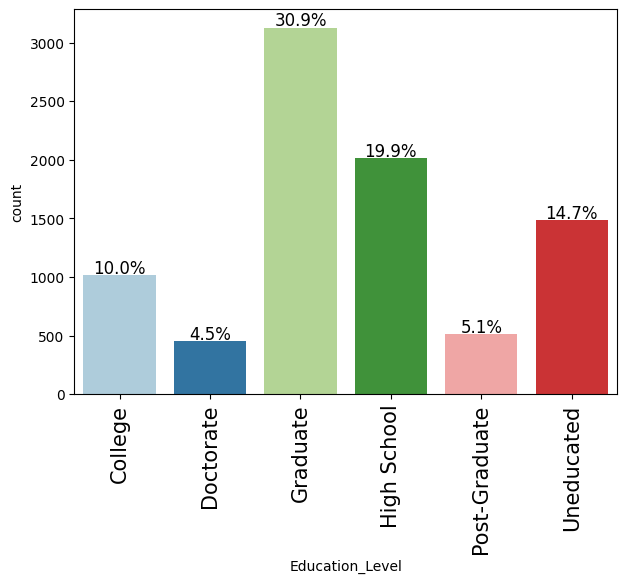

In [25]:
labeled_barplot(data, 'Education_Level',True)



*   Graduate Customers are highest in the credit card users data - 30.9%
*   High School is next highest count - 19.9%
*   Uneducated is the third highest on customer education level - 14.7%
*   Number of doctorates are less compared to other education level - 4.5%



#### Bivariate Analysis

In [26]:
#Bivariate analysis pairplot and heatmap needs target variable as number
df = data.copy()
df['Attrition_Flag']=df['Attrition_Flag'].astype("category")
df["Attrition_Flag"].replace("Existing Customer", "0", inplace=True)
df["Attrition_Flag"].replace("Attrited Customer", "1", inplace=True)
df['Attrition_Flag']=df['Attrition_Flag'].astype("int")

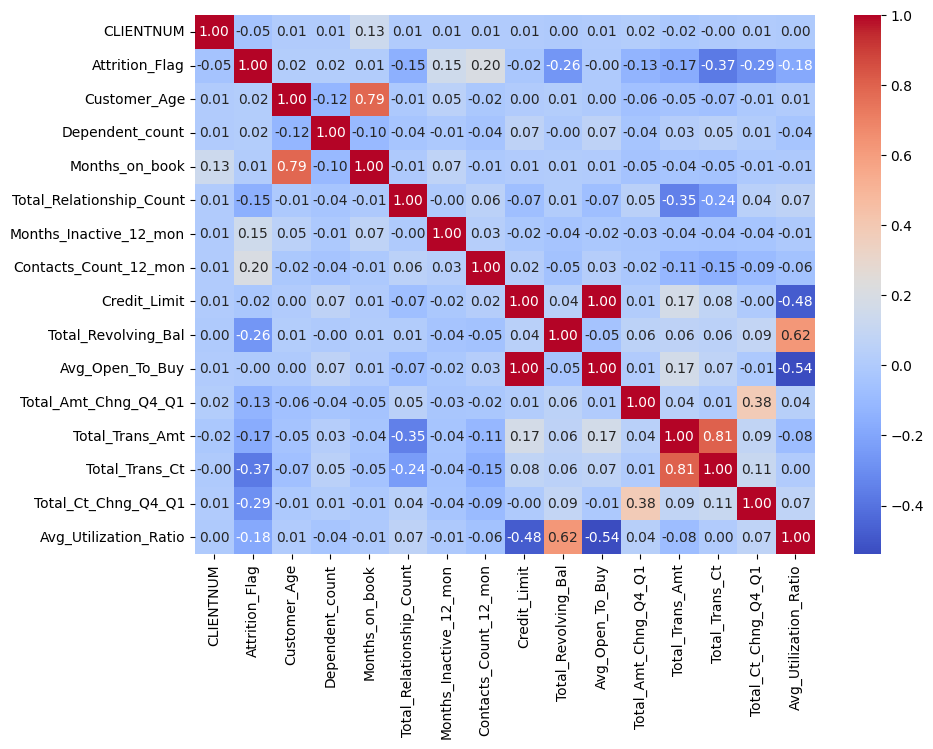

In [27]:
# defining the figure size
plt.figure(figsize=(10, 7))

# plotting the correlation heatmap
sns.heatmap(df.corr(numeric_only = True), annot=True, fmt='0.2f', cmap='coolwarm');

* There is no strong correlation either with the target or between any independent variable.

*   Total_Trans_Amt and Total_Trans_Ct have highest positively correlation : 0.81
*   Customer_Age and Months_on_book are highly positively correlated : 0.79
*   Total_Revolving_Bal and Avg_Utilization_Ratio are highly positively correlated :0.62



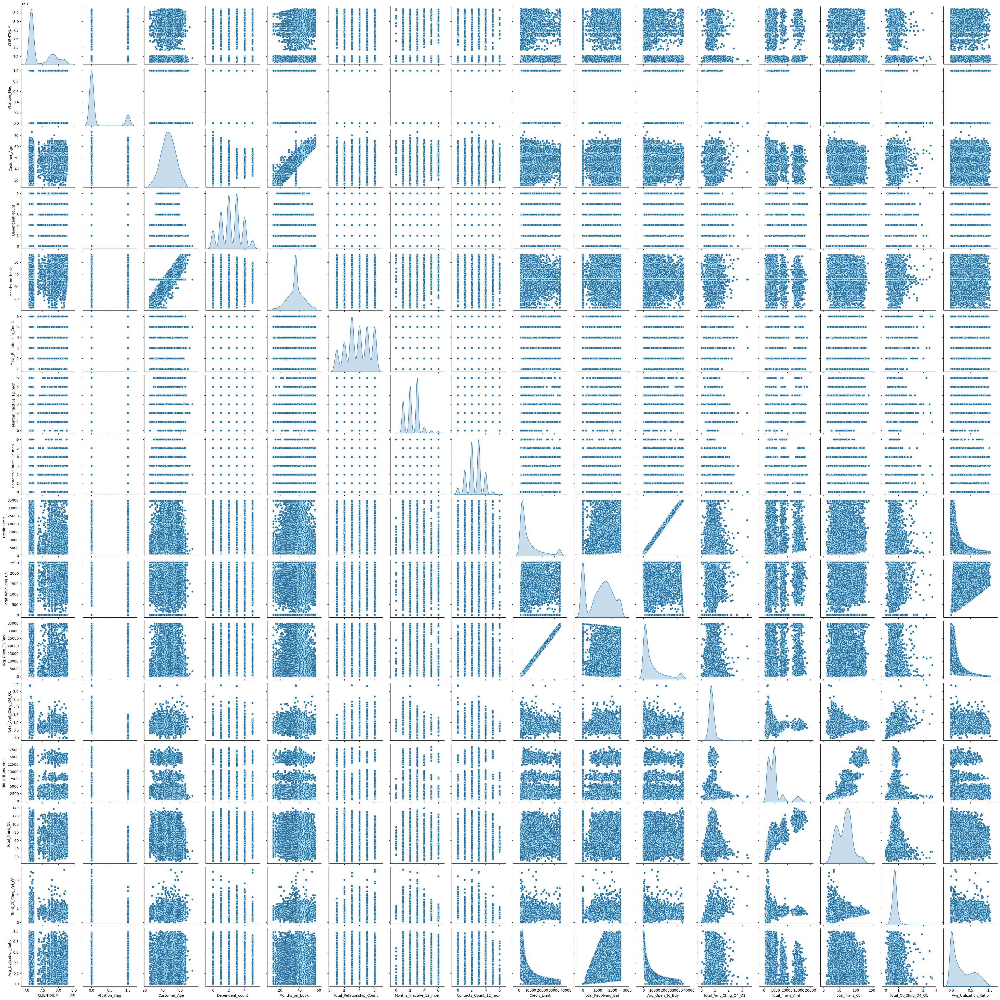

In [28]:
sns.pairplot(data=df, diag_kind="kde")
plt.show()

**Attrition_Flag vs Gender**

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


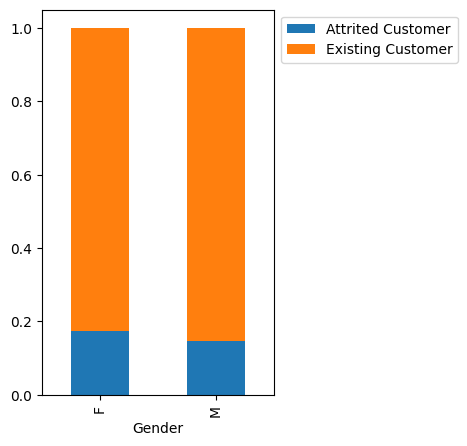

In [29]:
stacked_barplot(data, 'Gender','Attrition_Flag')

In [30]:
data['Gender'].value_counts(normalize=True)

,Gender
F,0.529081
M,0.470919


In [31]:
data.groupby('Gender')['Attrition_Flag'].value_counts(normalize=True)

Gender  Attrition_Flag   
F       Existing Customer    0.826428
        Attrited Customer    0.173572
M       Existing Customer    0.853848
        Attrited Customer    0.146152
Name: Attrition_Flag, dtype: float64

* 52.9 % of the customers are Females.
* 17% of the Females are attrited customers.
* 85% of the Males are existing customers.

**Attrition_Flag vs Education Level**

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


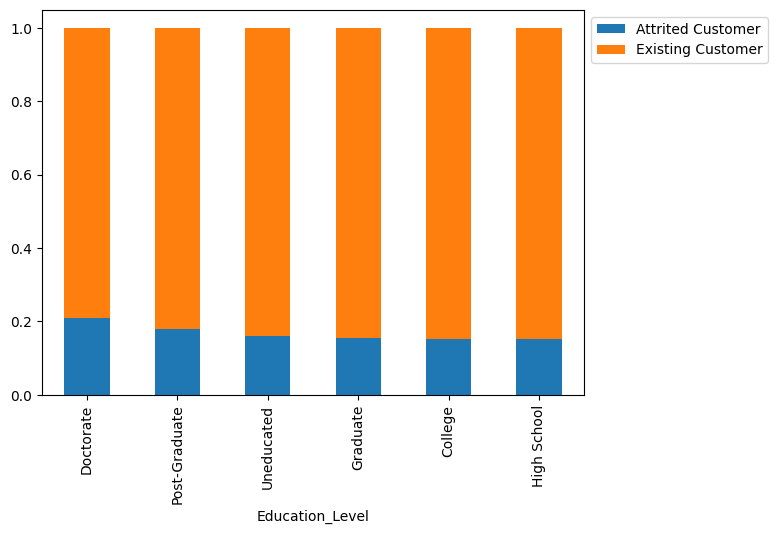

In [32]:
stacked_barplot(data, 'Education_Level','Attrition_Flag')

* At every level, existing customers are more than attrited customers
* Majority of the customers are graduates
* Next highest is the High School education level.
* Post Graduate customers are least.

**Attrition_Flag vs Marital Status**

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


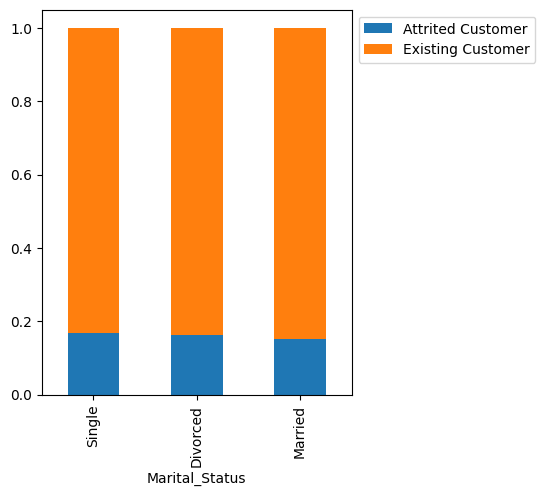

In [33]:
stacked_barplot(data, 'Marital_Status','Attrition_Flag')

**Attrition_Flag vs Income_Category**

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


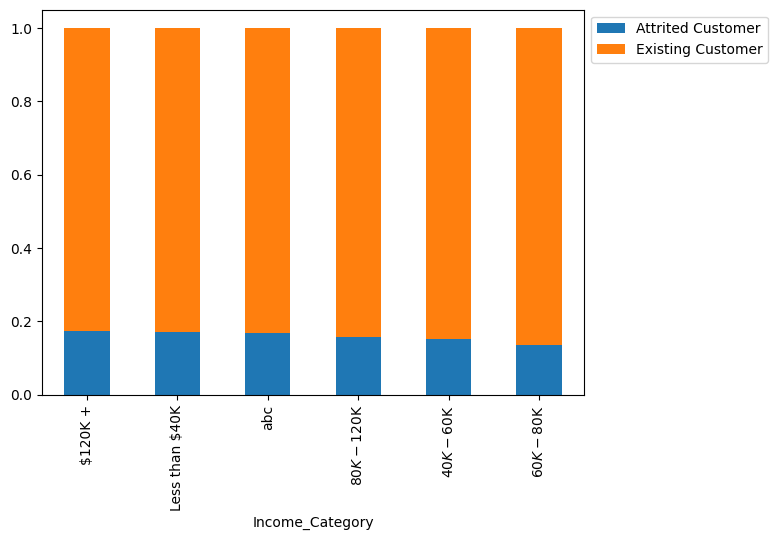

In [34]:
stacked_barplot(data, 'Income_Category','Attrition_Flag')

* Less than $40K highest Income category

* There are less customers with Income $120K+


**Attrition_Flag vs Card Category**

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


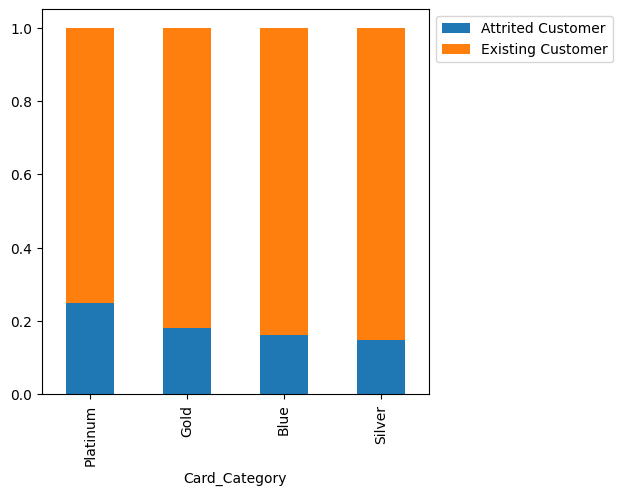

In [35]:
stacked_barplot(data, 'Card_Category','Attrition_Flag')

* Blue card customers are highest at both attitied and existing customer status
* Next highest card level are Silver customers
* There are very few Platinum card holders

Categorical Features:
['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
Attrition_Flag     Attrited Customer  Existing Customer    All
Attrition_Flag                                                
Attrited Customer               1627                  0   1627
All                             1627               8500  10127
Existing Customer                  0               8500   8500
------------------------------------------------------------------------------------------------------------------------


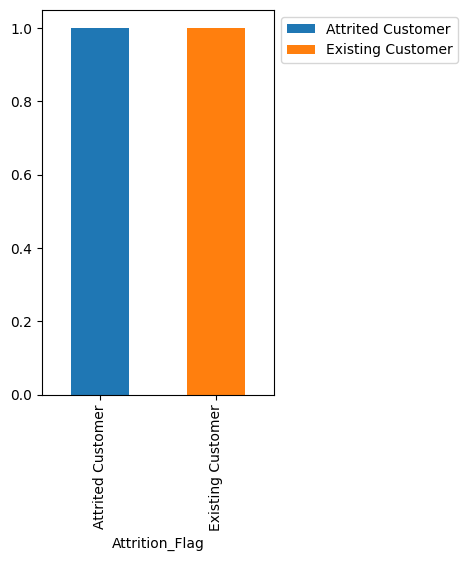

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


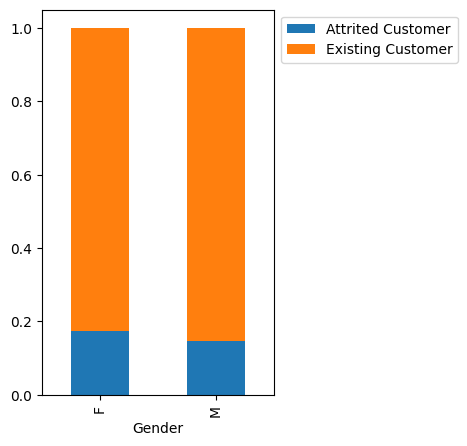

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


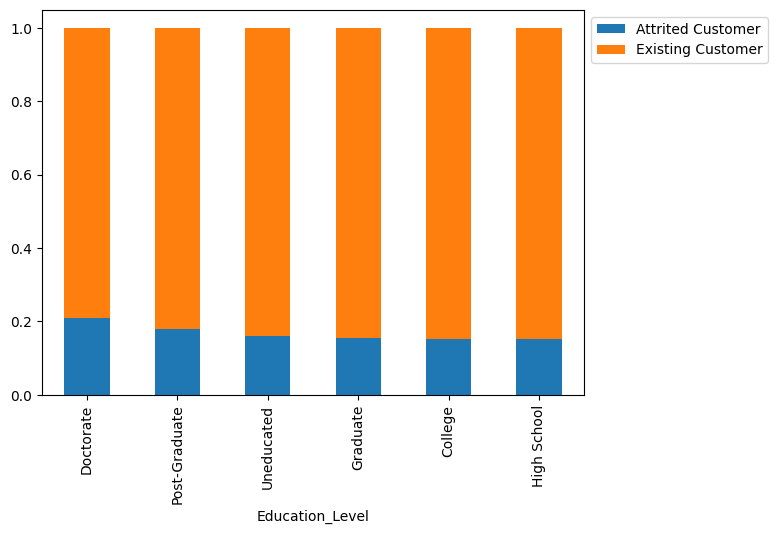

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


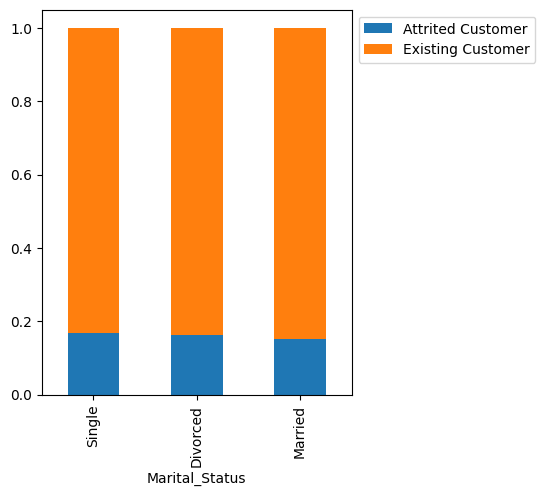

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


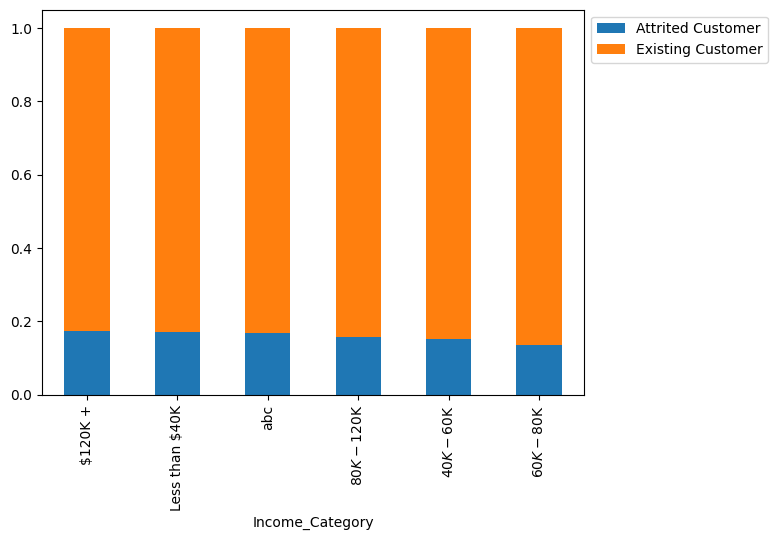

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


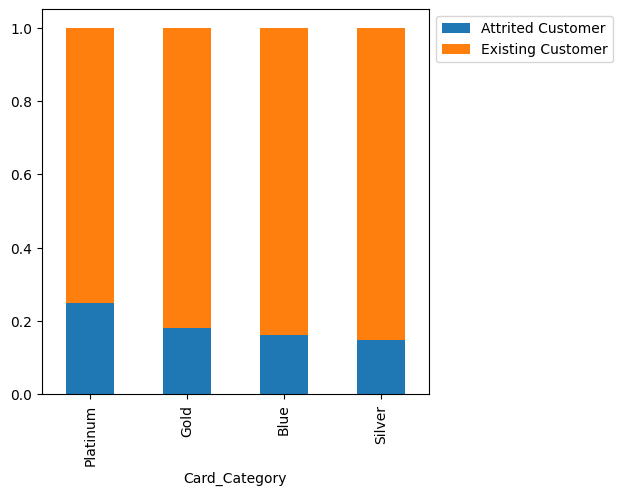

In [36]:
# defining the list of categorical features to plot
features = data.select_dtypes(include=['object']).columns.tolist()

print("Categorical Features:")
print(features)
# creating the histograms
for i, feature in enumerate(features):
    stacked_barplot(data, feature,'Attrition_Flag')

**Observation on "Total_Ct_Chng_Q4_Q1" Vs Attrition_Flag**

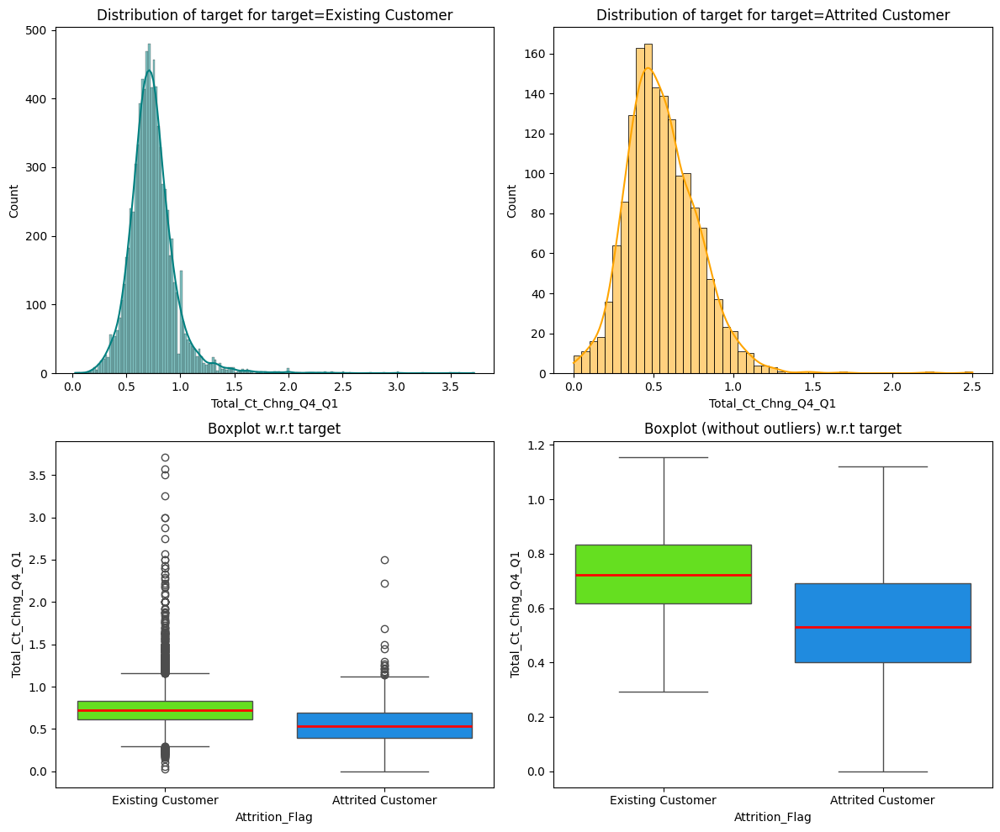

In [37]:
distribution_plot_wrt_target(data, 'Total_Ct_Chng_Q4_Q1', 'Attrition_Flag')

* Distribution of Total_Ct_Chng_Q4_Q1 is normal for both "Existing Customer" and "Attrited Customer"
* There are outliers in Total_Ct_Chng_Q4_Q1
* Change in Transaction Count between Q4 and Q1 without outliers for Existing Customers varies between 0.3-1.2 with median around 0.7 and for Attrited customers it ranges approximately from 0-1.1 with median around 0.5
* Higher change in transaction count Q4 over Q1 indicates customer is less likely to churn


**Observation on "Months_Inactive_12_mo" Vs Attrition_Flag**

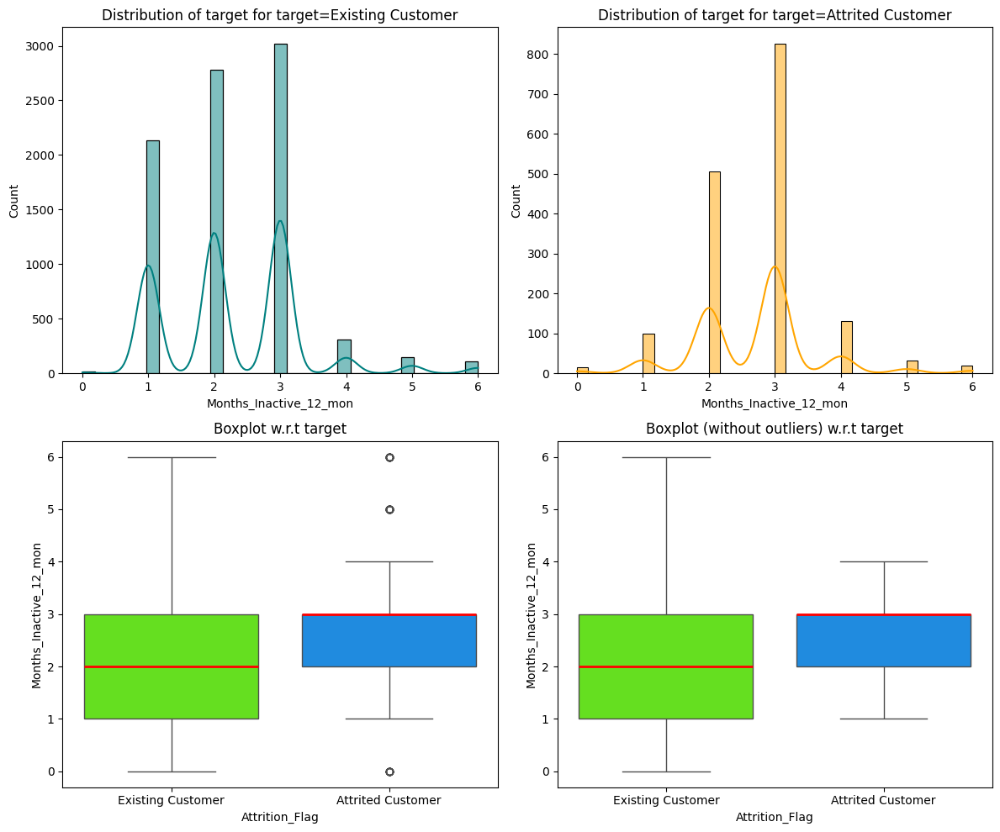

In [38]:
distribution_plot_wrt_target(data, 'Months_Inactive_12_mon', 'Attrition_Flag')

* There are outliers for Attrited Customers in Months_Inactive_12_mon
* Existing customers have median around 2 months inactive in the last 12 months
and attrited customers have around 3 months inactive median in the last 12 months.


**Total Transaction Count in the last 12 months Vs Attrition_Flag**

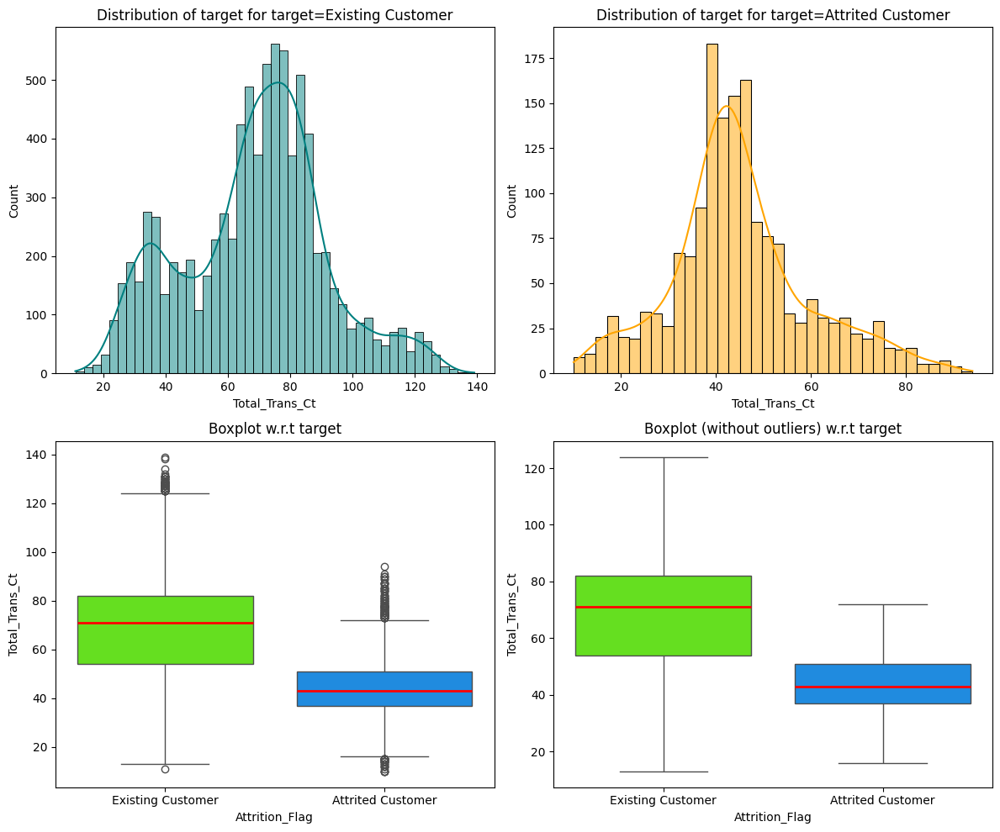

In [39]:
distribution_plot_wrt_target(data, 'Total_Trans_Ct', 'Attrition_Flag')

* Box plot analysis shows that highest transaction count in the last 12 months for Existing customers than Attrited customers. Median of around 70 transactions for Existing customer
* Decrease in transaction shows attrited customers - median of around 40 transactions

**Total Revolving Balance Vs Attrition_Flag**

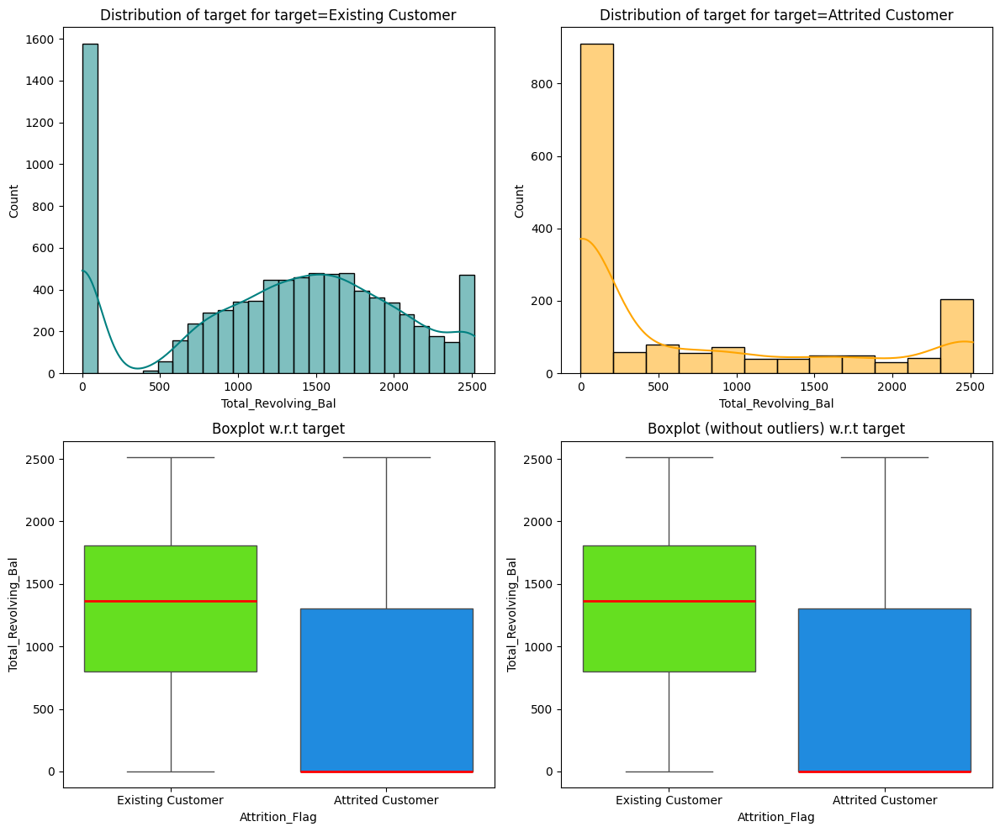

In [40]:
distribution_plot_wrt_target(data, 'Total_Revolving_Bal', 'Attrition_Flag')

* if the Revolving balance varies from 0 to 2500 is most likely will remain customer
* Lower median of revolving balance around 0 in Attrited Customer could suggest  that customers who are not using their card much and thus have a lower revolving balance are more likely to churn
* Higher revolving balance are most likely to remain as customers


**Total Relationship Count Vs Attrition_Flag**

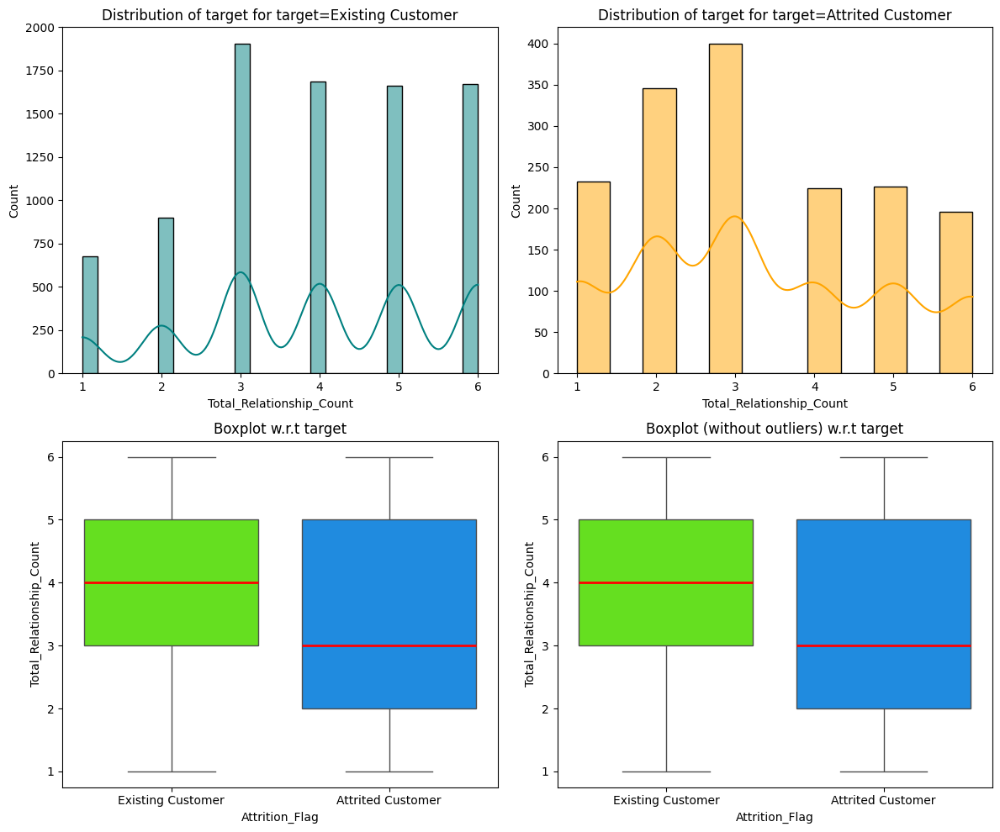

In [41]:
distribution_plot_wrt_target(data, 'Total_Relationship_Count', 'Attrition_Flag')

* Total number of products held by existing customers varies from 1-6 with median around 4
* Incase of attrited group median is around 3.


**Total Transaction Count Vs Attrition Flag**

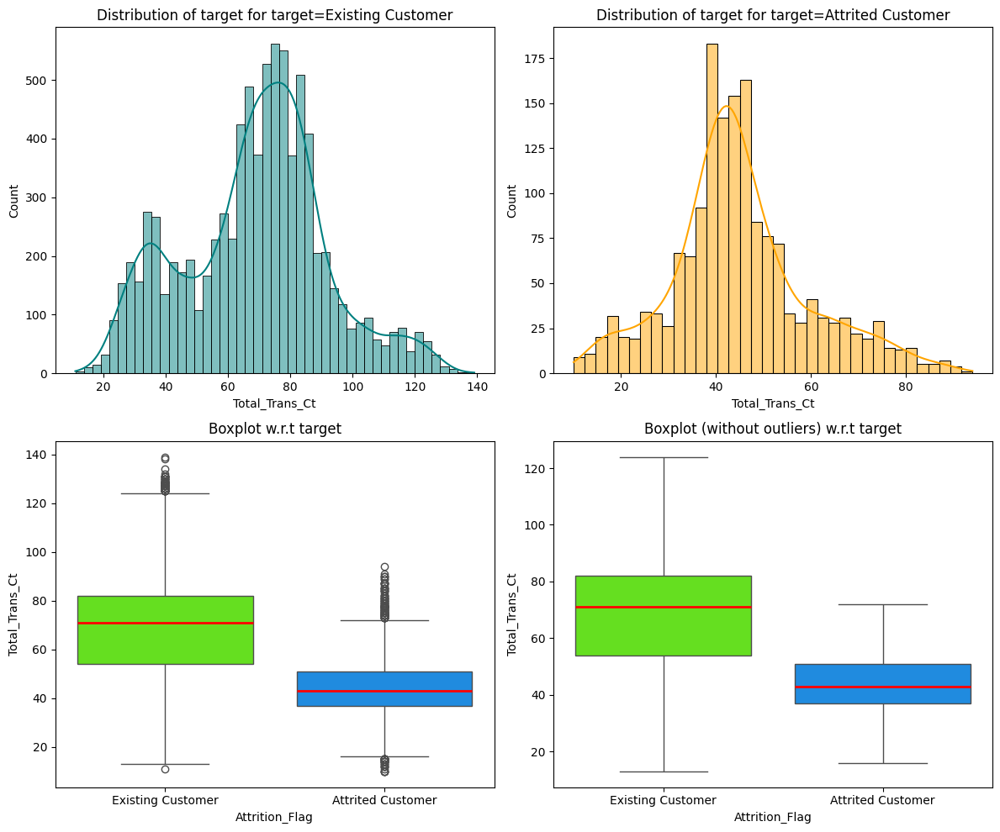

In [42]:
distribution_plot_wrt_target(data, 'Total_Trans_Ct', 'Attrition_Flag')

* Customers with higher transaction count are less likely to churn . Median of around 70 transactions in the last 12 months.

**Average Open to Buy Vs Attrition Flag**

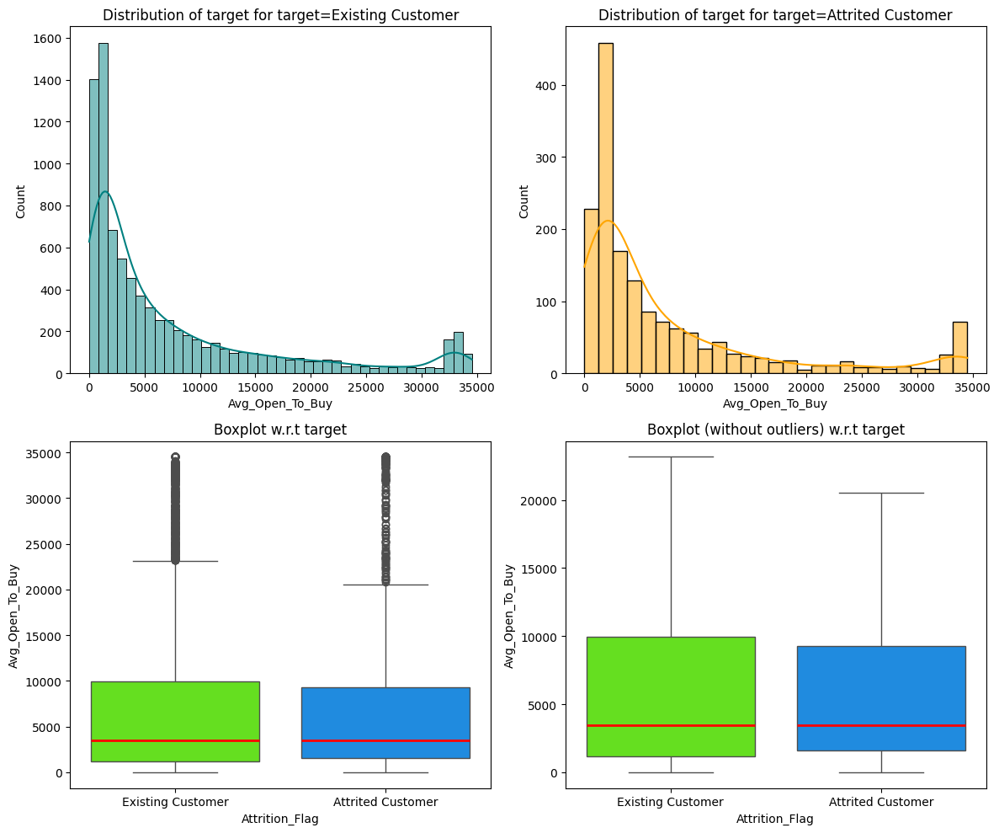

In [43]:
distribution_plot_wrt_target(data, 'Avg_Open_To_Buy', 'Attrition_Flag')

**Average Utilization Ratio Vs Attrition_Flag**

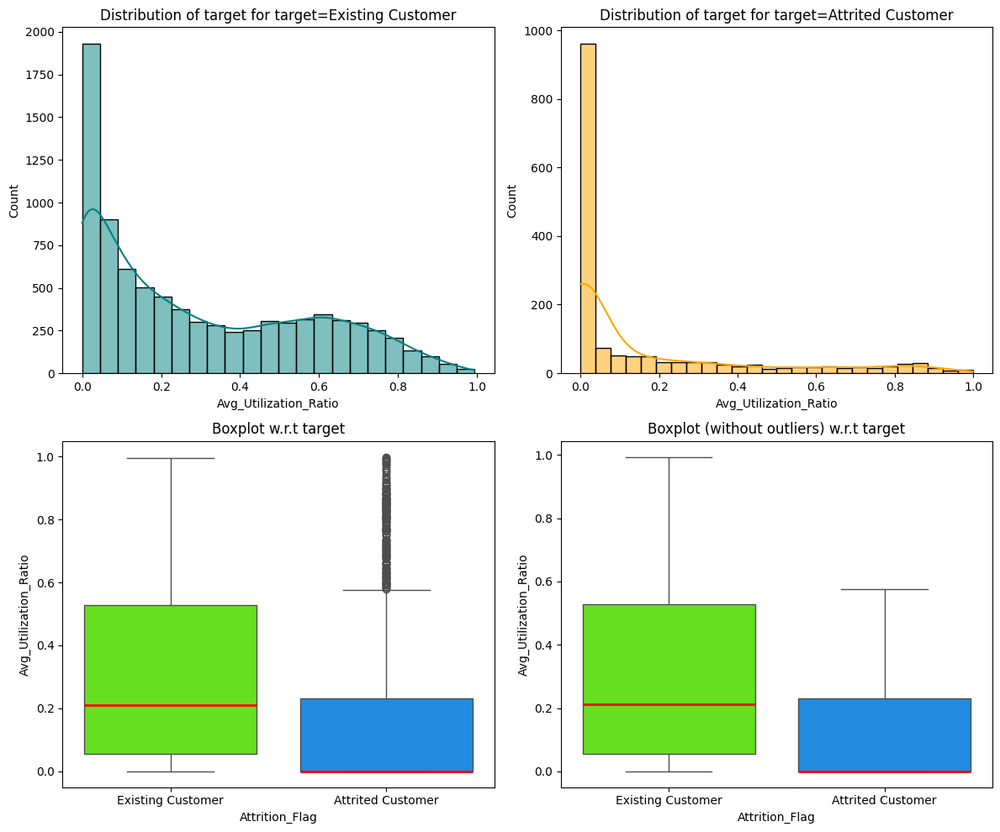

In [44]:
distribution_plot_wrt_target(data, 'Avg_Utilization_Ratio', 'Attrition_Flag')

**All Features Vs Attrition_Flag**

All Features:
['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


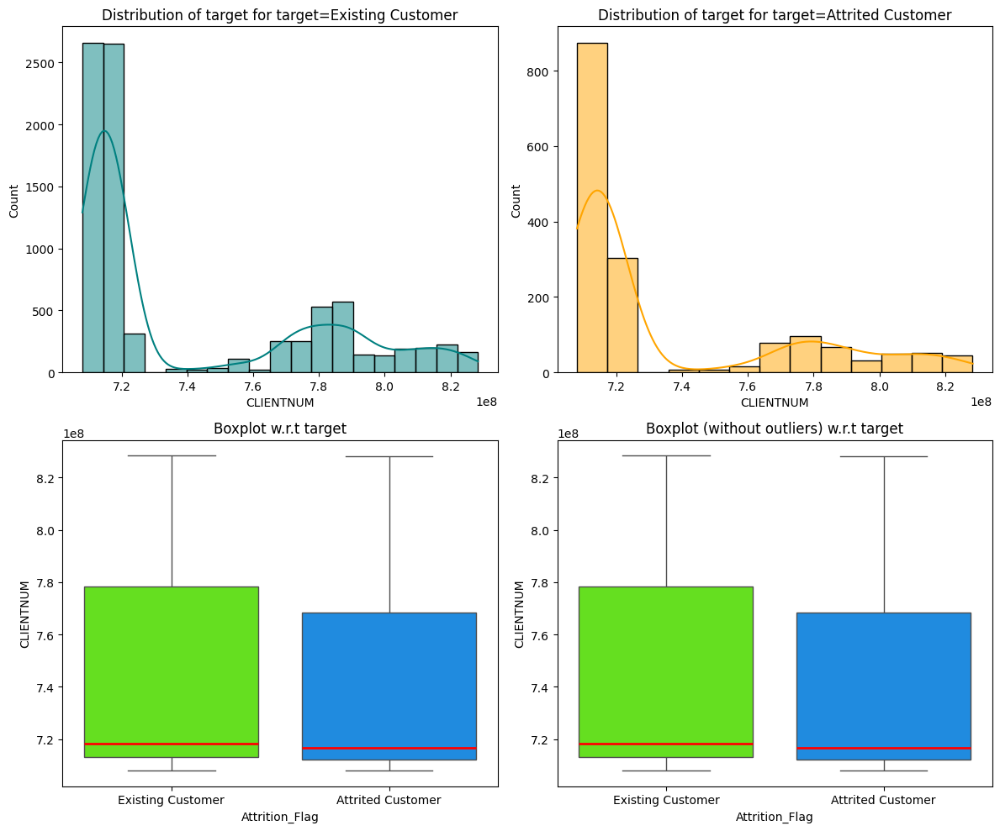

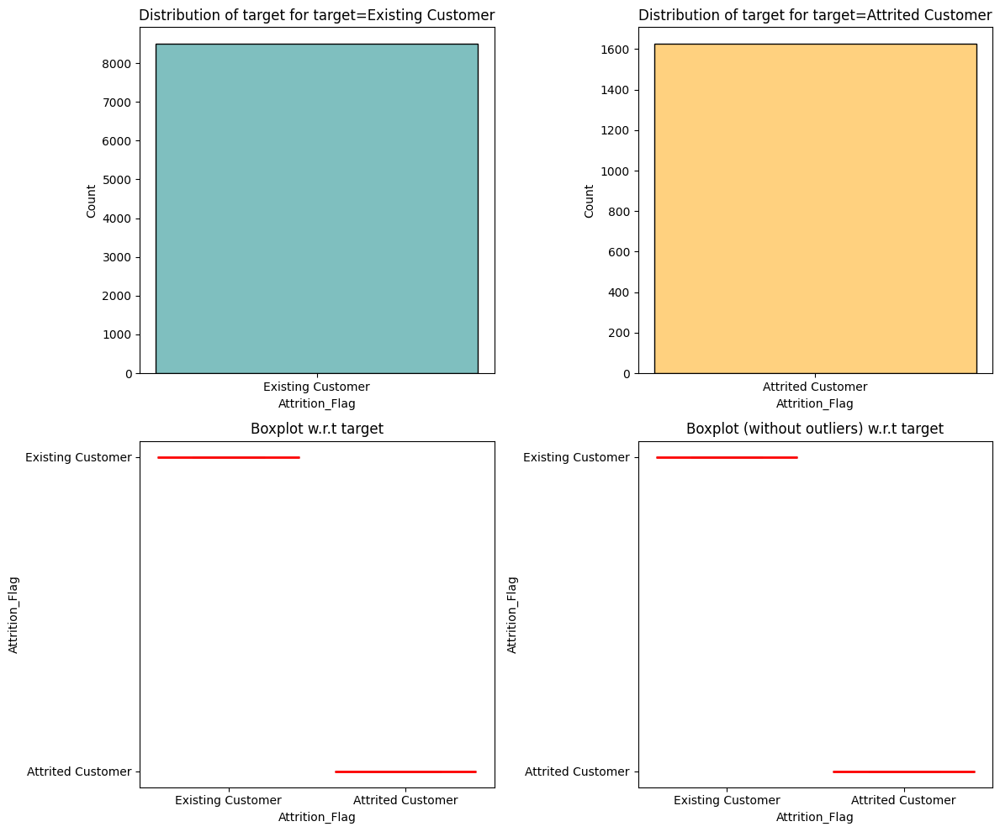

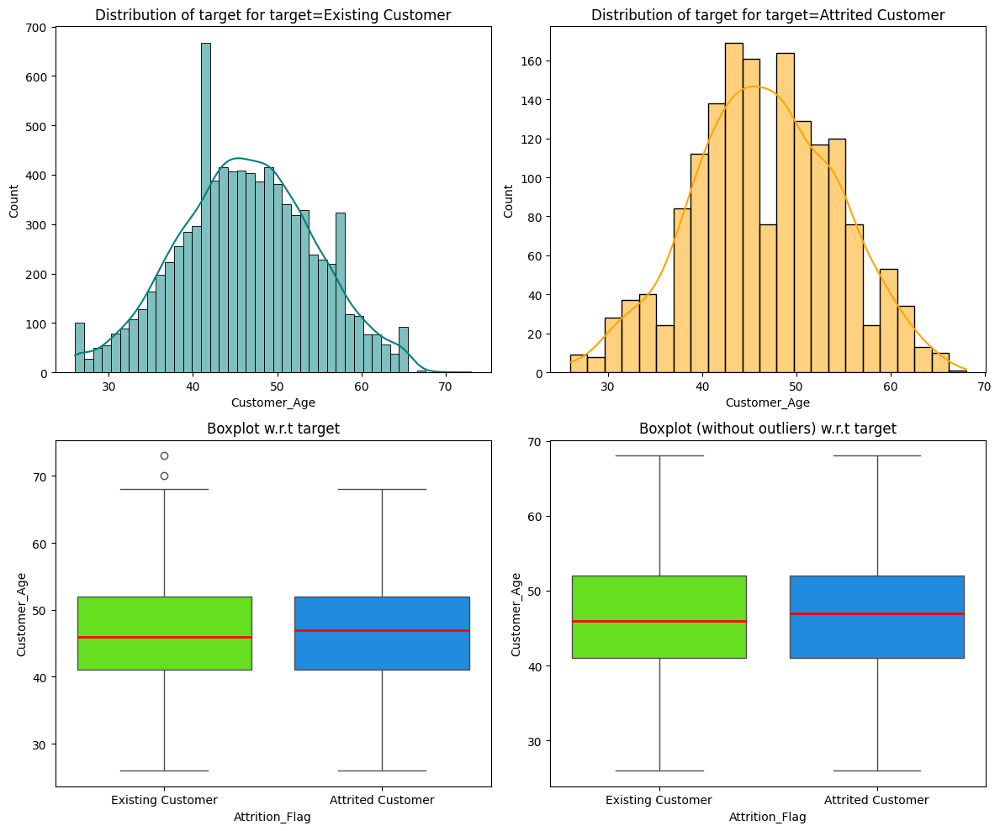

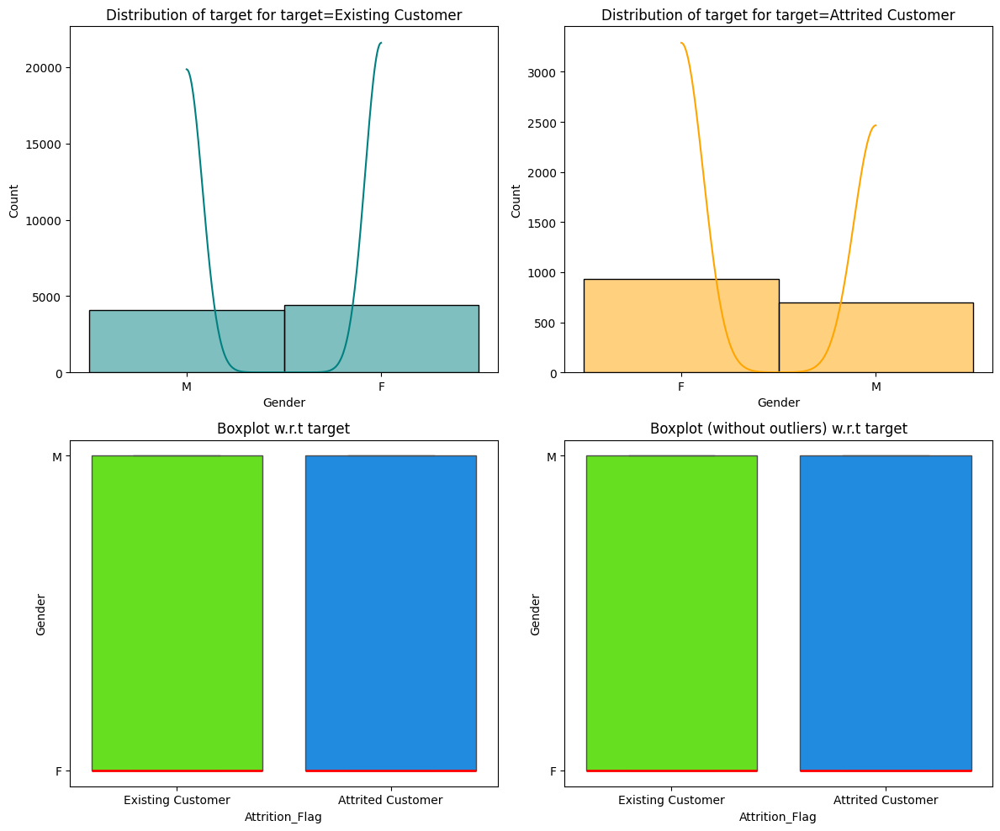

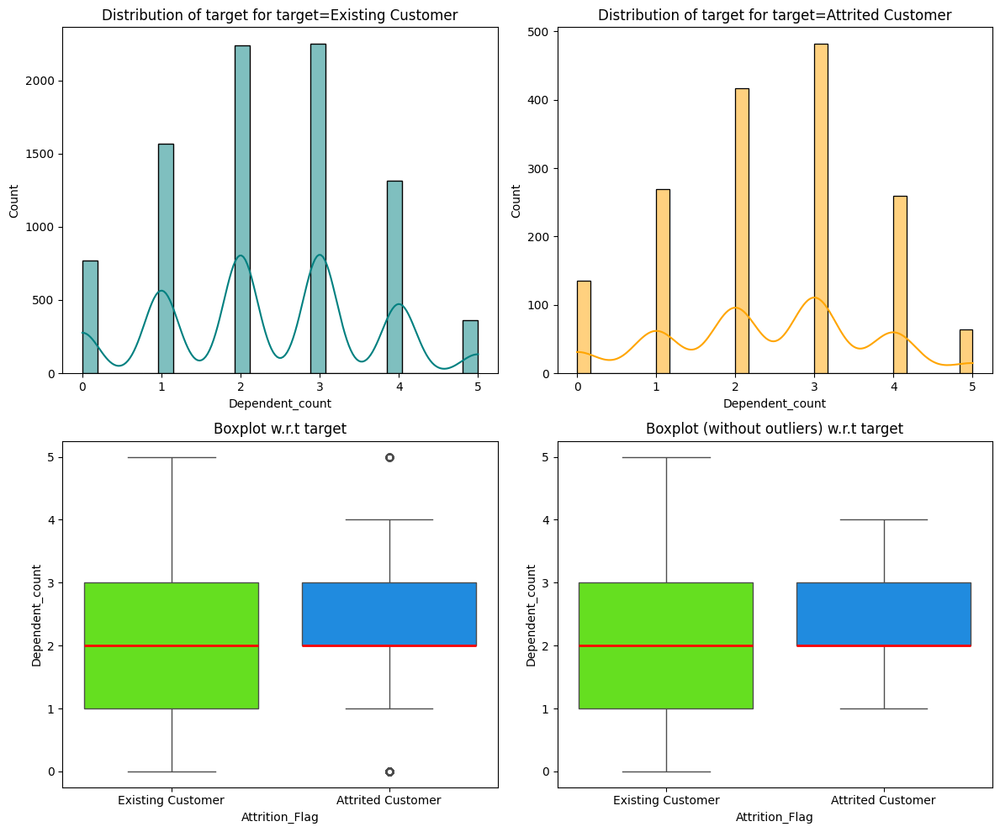

...

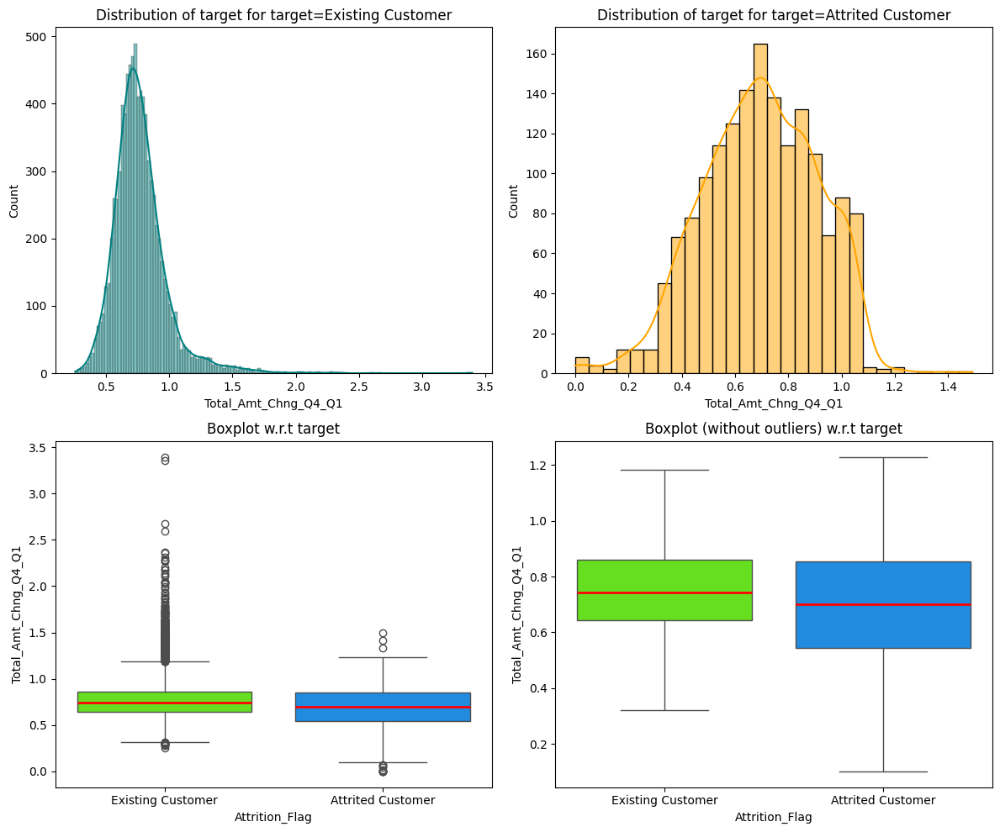

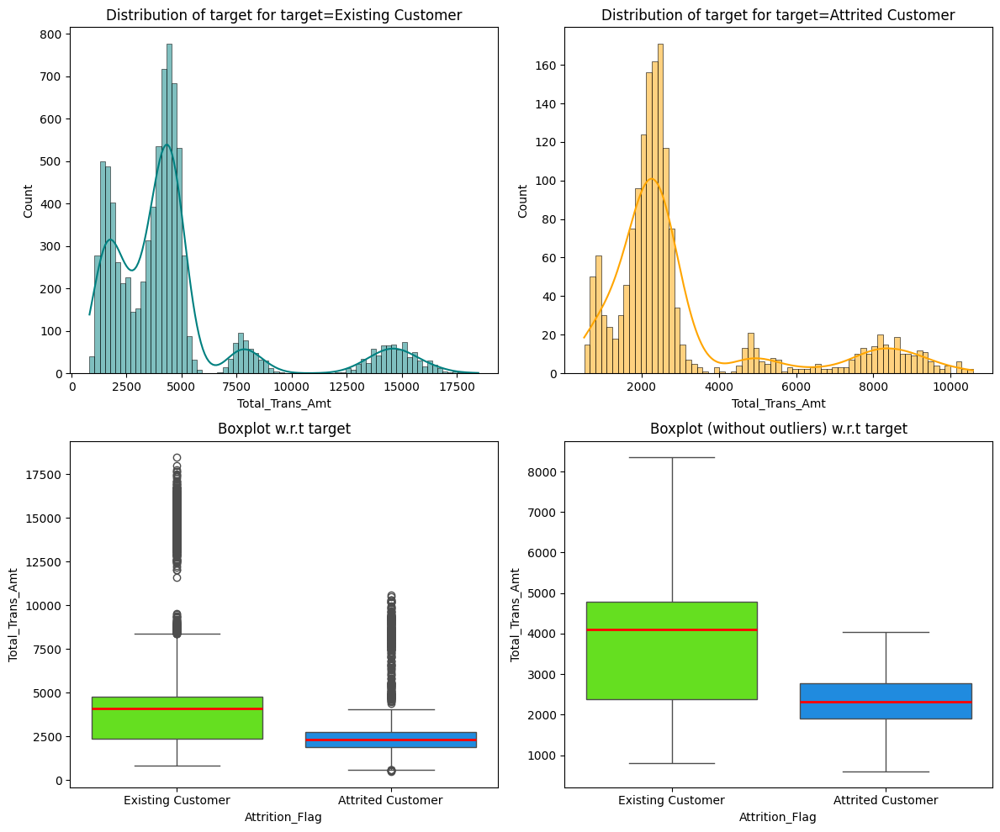

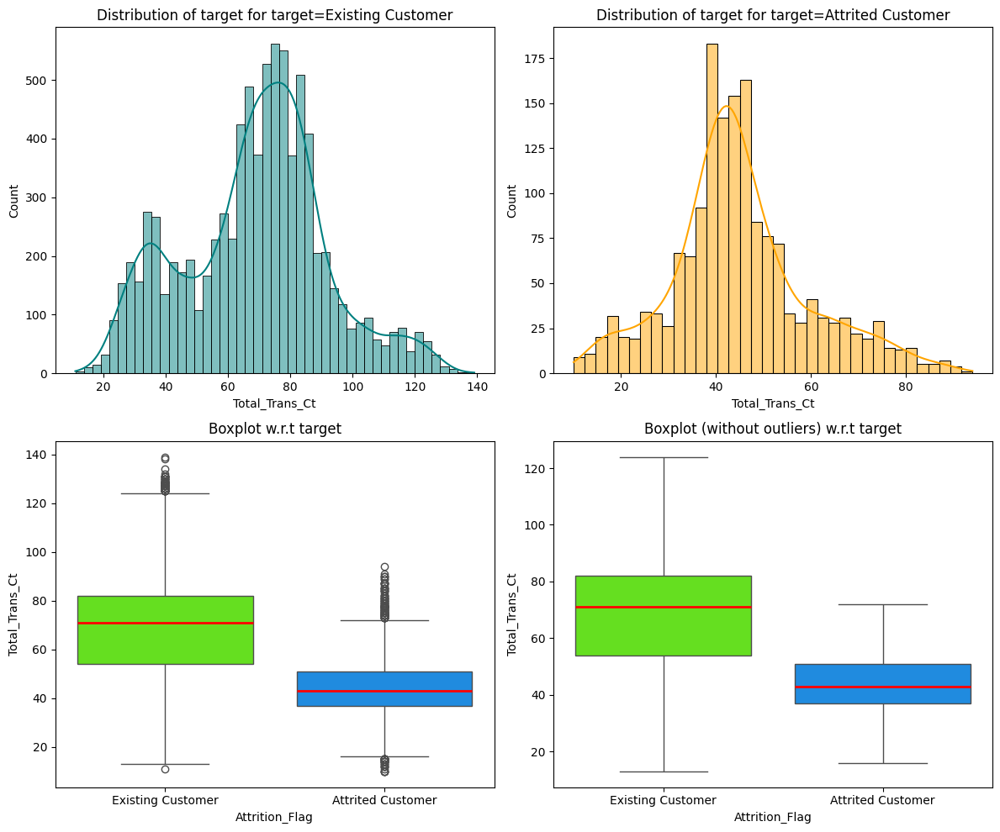

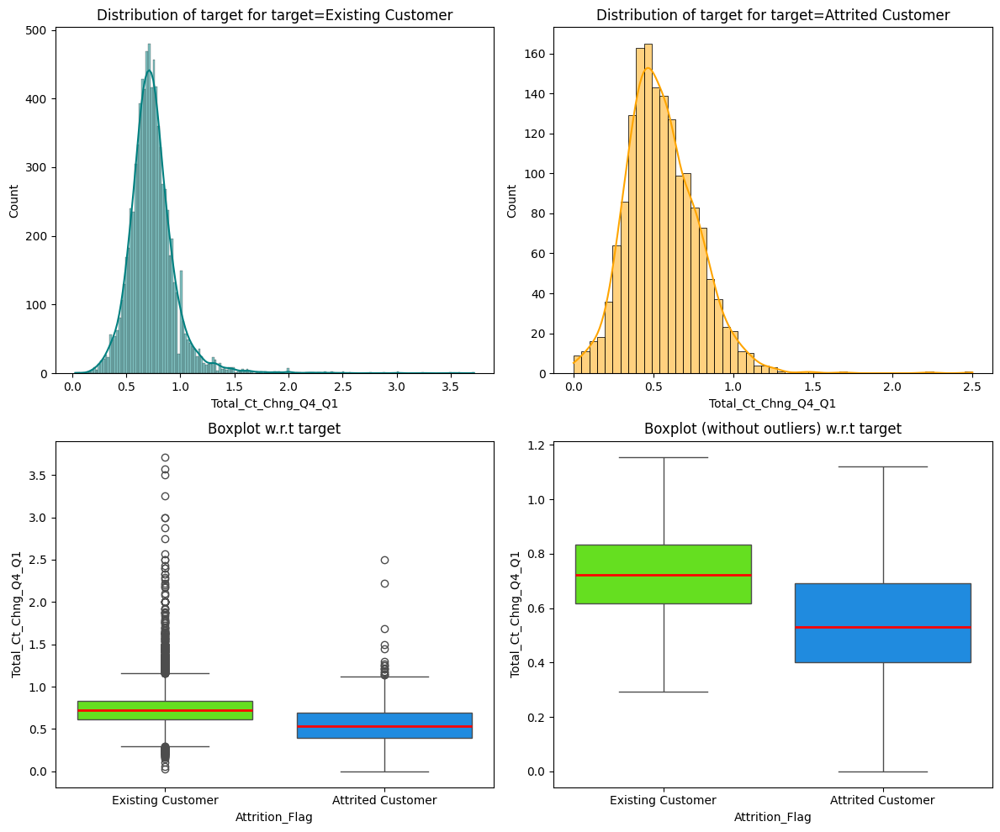

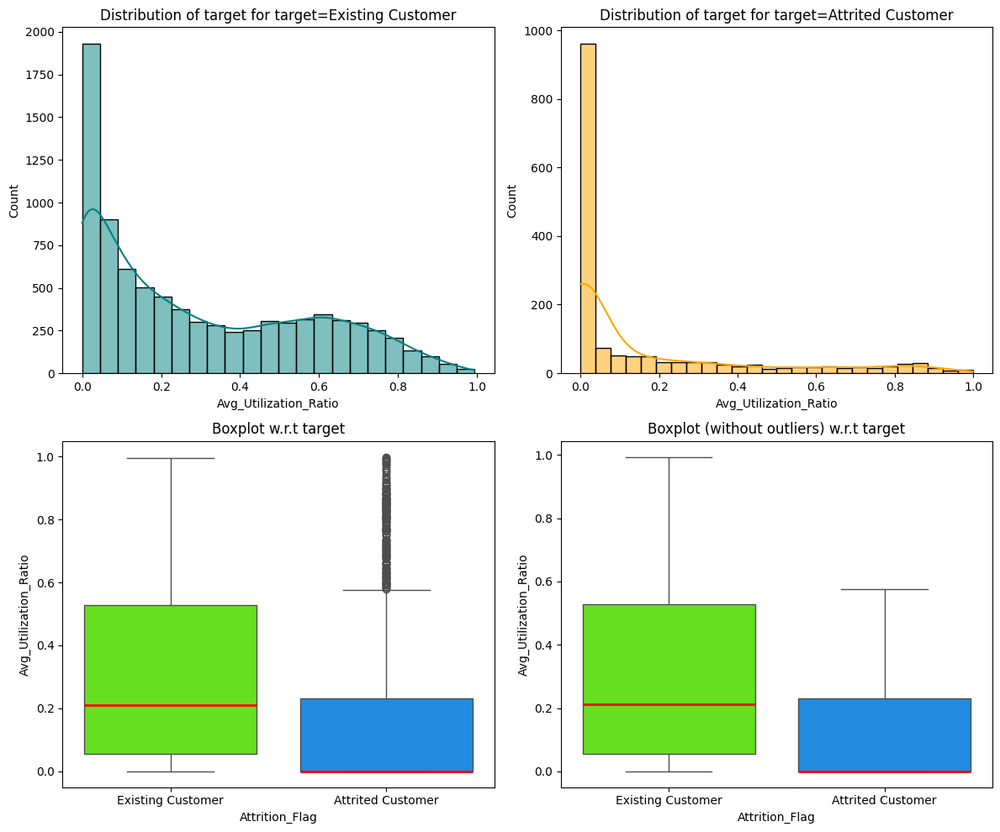

In [45]:
#features = data.select_dtypes(include=['number']).columns.tolist()
features = data.columns.tolist()
print("All Features:")
print(features)
# creating the histograms
for i, feature in enumerate(features):
  distribution_plot_wrt_target(data, feature, 'Attrition_Flag')

* Based on the above box plot distribution with and without Outlier with respect to target, outliers are not treated

### Summary of EDA

*   There are 15 numerical columns and 6 Object Types
*   Education_Level and Marital_Status have missing values

**Data Cleaning:**

*   Drop "CLIENTNUM" as "CLIENTNUM" is unique for each customer and might not add value to modeling.
*   Missing value imputation will be done after splitting the data.

**Observations from EDA**
**Univariate Analysis**

Total_Trans_Amount data is right skewed
Customers with less than $40K income are highest  and
customers with $120K+ income is the least income category
Around 30.9% of credit card customers are graduates.
35.2% of Customers are with less than $40K income.

**Bivariate Analysis**

Total_Trans_Amt and Total_Trans_Ct have highest positively correlation : 0.81
* Blue card customers are highest at both attitied and existing customer status
*  There are very few Platinum card holders
* Decrease in transaction count in the last 12 months shows attrited customers - median of around 40 transactions
* Customers with higher transaction count,higher relationship count, high revolving balance are less likely to churn

## Data Pre-processing



*   Missing value treatment
*   Feature engineering (if needed)
*   Outlier detection and treatment (if needed)
*   Preparing data for modeling
*   Any other preprocessing steps (if needed)








### Feature Engineering


In [46]:
#Convert object type to category
data['Income_Category']=data['Income_Category'].astype("category")
data['Card_Category']=data['Card_Category'].astype("category")
data['Gender']=data['Gender'].astype("category")
data['Attrition_Flag']=data['Attrition_Flag'].astype("category")
data['Education_Level']=data['Education_Level'].astype("category")
data['Marital_Status']=data['Marital_Status'].astype("category")

In [47]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CLIENTNUM                 10127 non-null  int64   
 1   Attrition_Flag            10127 non-null  category
 2   Customer_Age              10127 non-null  int64   
 3   Gender                    10127 non-null  category
 4   Dependent_count           10127 non-null  int64   
 5   Education_Level           8608 non-null   category
 6   Marital_Status            9378 non-null   category
 7   Income_Category           10127 non-null  category
 8   Card_Category             10127 non-null  category
 9   Months_on_book            10127 non-null  int64   
 10  Total_Relationship_Count  10127 non-null  int64   
 11  Months_Inactive_12_mon    10127 non-null  int64   
 12  Contacts_Count_12_mon     10127 non-null  int64   
 13  Credit_Limit              10127 non-null  floa

In [48]:
data['Attrition_Flag'].value_counts(normalize="True")

,Attrition_Flag
Existing Customer,0.83934
Attrited Customer,0.16066


In [49]:
features = data.select_dtypes(include=['category']).columns.tolist()
print("Categorical Features:")
print(features)
# creating the histograms
for i, feature in enumerate(features):
  print(data[feature].value_counts())

Categorical Features:
['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
F    5358
M    4769
Name: Gender, dtype: int64
Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
abc               1112
$120K +            727
Name: Income_Category, dtype: int64
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64


In [50]:
data['Income_Category'].value_counts()

,Income_Category
Less than $40K,3561
$40K - $60K,1790
$80K - $120K,1535
$60K - $80K,1402
abc,1112
$120K +,727


In [51]:
replaceStruct = {
                  "Gender":        {"M":0,"F":1},
                  "Attrition_Flag":     {"Existing Customer": 0, "Attrited Customer": 1 },
                  "Card_Category":     {"Blue": 0, "Silver": 1, "Gold": 2, "Platinum": 3},
                  "Education_Level":     {"Uneducated": 0, "High School": 1, "College": 2, "Graduate": 3, "Post-Graduate": 4, "Doctorate": 5},
                  "Marital_Status":     {"Single": 0, "Married": 1, "Divorced": 2},
                  "Income_Category":     {"Less than $40K": 0, "$40K - $60K": 1, "$60K - $80K": 2, "$80K - $120K": 3, "$120K +": 4,"abc":5}
                }


In [52]:
#Copy of data before treatment
data_copy = data.copy()

In [53]:
data=data.replace(replaceStruct)

#Convert Non Missing Values Columns to Int type
for column in replaceStruct:
  if column != "Education_Level" and column != "Marital_Status":
    data[column] = data[column].astype(int)

data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,0,45,0,3,1,1,2,0,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,0,49,1,5,3,0,0,0,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,0,51,0,3,3,1,3,0,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,0,40,1,4,1,NaN,0,0,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,0,40,0,3,0,1,2,0,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [54]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   CLIENTNUM                 10127 non-null  int64   
 1   Attrition_Flag            10127 non-null  int64   
 2   Customer_Age              10127 non-null  int64   
 3   Gender                    10127 non-null  int64   
 4   Dependent_count           10127 non-null  int64   
 5   Education_Level           8608 non-null   category
 6   Marital_Status            9378 non-null   category
 7   Income_Category           10127 non-null  int64   
 8   Card_Category             10127 non-null  int64   
 9   Months_on_book            10127 non-null  int64   
 10  Total_Relationship_Count  10127 non-null  int64   
 11  Months_Inactive_12_mon    10127 non-null  int64   
 12  Contacts_Count_12_mon     10127 non-null  int64   
 13  Credit_Limit              10127 non-null  floa

*   Values have been encoded.
*   We will do the missing value treatment after splitting the data
*   We will treat incorrect "Income Category" that has "abc" value that is encoded as "5" . Will treat after splitting.





In [55]:
data.nunique()

,0
CLIENTNUM,10127
Attrition_Flag,2
Customer_Age,45
Gender,2
Dependent_count,6
Education_Level,6
Marital_Status,3
Income_Category,6
Card_Category,4
Months_on_book,44


Drop "CLIENTNUM" as "CLIENTNUM" is unique for each candidate and might not add value to modeling.

In [56]:
data.drop(["CLIENTNUM"],axis=1,inplace=True)

## Outliers Treatment

In [57]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Attrition_Flag,10127.0,0.160660,0.367235,0.0,0.000,0.000,0.000,1.000
Customer_Age,10127.0,46.325960,8.016814,26.0,41.000,46.000,52.000,73.000
Gender,10127.0,0.529081,0.499178,0.0,0.000,1.000,1.000,1.000
Dependent_count,10127.0,2.346203,1.298908,0.0,1.000,2.000,3.000,5.000
Income_Category,10127.0,1.744544,1.716188,0.0,0.000,1.000,3.000,5.000
Card_Category,10127.0,0.083638,0.333784,0.0,0.000,0.000,0.000,3.000
Months_on_book,10127.0,35.928409,7.986416,13.0,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.0,3.812580,1.554408,1.0,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.0,2.341167,1.010622,0.0,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.0,2.455317,1.106225,0.0,2.000,2.000,3.000,6.000


* Outliers observed but no outlier treatment as removing or altering these values might distort the true patterns in the data.
* This may be legitimate data according to Business context



## Missing value imputation




In [58]:
data.isna().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [59]:
# separating the independent and dependent variables
X = data.drop(["Attrition_Flag"], axis=1)
y = data["Attrition_Flag"]

In [60]:
# Splitting data into training, validation and test sets:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)
print("Test Data y_test", y_test.shape)

(6075, 19) (2026, 19) (2026, 19)
Test Data y_test (2026,)


In [61]:
data.isna().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,1519
Marital_Status,749
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [62]:
X_train.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,928
Marital_Status,457
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


In [63]:
X_val.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,294
Marital_Status,140
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


In [64]:
X_test.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,297
Marital_Status,152
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


In [65]:
# Create an imputer object with strategy set to 'most_frequent' for Education_Level
imputer = SimpleImputer(missing_values=np.nan,strategy='most_frequent')

# Fit the imputer on the training data and transform it
X_train['Education_Level'] = imputer.fit_transform(X_train[['Education_Level']]).ravel()  # ravel() is used to convert 2D array to 1D

# Transform the validation and test data using the fitted imputer
X_val['Education_Level'] = imputer.transform(X_val[['Education_Level']]).ravel()
X_test['Education_Level'] = imputer.transform(X_test[['Education_Level']]).ravel()

In [66]:
# Fit the imputer on the training data and transform it
X_train['Marital_Status'] = imputer.fit_transform(X_train[['Marital_Status']]).ravel()  # ravel() is used to convert 2D array to 1D

# Transform the validation and test data using the fitted imputer
X_val['Marital_Status'] = imputer.transform(X_val[['Marital_Status']]).ravel()
X_test['Marital_Status'] = imputer.transform(X_test[['Marital_Status']]).ravel()

In [67]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6075 entries, 800 to 4035
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Customer_Age              6075 non-null   int64  
 1   Gender                    6075 non-null   int64  
 2   Dependent_count           6075 non-null   int64  
 3   Education_Level           6075 non-null   float64
 4   Marital_Status            6075 non-null   float64
 5   Income_Category           6075 non-null   int64  
 6   Card_Category             6075 non-null   int64  
 7   Months_on_book            6075 non-null   int64  
 8   Total_Relationship_Count  6075 non-null   int64  
 9   Months_Inactive_12_mon    6075 non-null   int64  
 10  Contacts_Count_12_mon     6075 non-null   int64  
 11  Credit_Limit              6075 non-null   float64
 12  Total_Revolving_Bal       6075 non-null   int64  
 13  Avg_Open_To_Buy           6075 non-null   float64
 14  Total_

In [68]:
X_train.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
800,40,0,2,3.0,0.0,4,0,21,6,4,3,20056.0,1602,18454.0,0.466,1687,46,0.533,0.080
498,44,0,1,3.0,1.0,5,0,34,6,2,0,2885.0,1895,990.0,0.387,1366,31,0.632,0.657
4356,48,0,4,1.0,1.0,3,0,36,5,1,2,6798.0,2517,4281.0,0.873,4327,79,0.881,0.370
407,41,0,2,3.0,1.0,2,1,36,6,2,0,27000.0,0,27000.0,0.610,1209,39,0.300,0.000
8728,46,0,4,1.0,2.0,1,1,36,2,2,3,15034.0,1356,13678.0,0.754,7737,84,0.750,0.090


In [69]:
X_train.shape

(6075, 19)

In [70]:
X_train['Income_Category'].value_counts()

,Income_Category
0,2129
1,1059
3,953
2,831
5,654
4,449


In [71]:
# prompt: replace "abc" encode "5" income category with the most frequestly occuring income since Income_Cateogry is non-numerical

# Find the median income range
most_frequent_income = X_train[X_train['Income_Category'] != 5]['Income_Category'].mode()[0]
print(most_frequent_income)
# Replace "abc" with the most frequent income category in the training set
X_train['Income_Category'] = X_train['Income_Category'].replace(5, most_frequent_income)
X_val['Income_Category'] = X_val['Income_Category'].replace(5, most_frequent_income)
X_test['Income_Category'] = X_test['Income_Category'].replace(5, most_frequent_income)


0


In [72]:
X_train.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
800,40,0,2,3.0,0.0,4,0,21,6,4,3,20056.0,1602,18454.0,0.466,1687,46,0.533,0.080
498,44,0,1,3.0,1.0,0,0,34,6,2,0,2885.0,1895,990.0,0.387,1366,31,0.632,0.657
4356,48,0,4,1.0,1.0,3,0,36,5,1,2,6798.0,2517,4281.0,0.873,4327,79,0.881,0.370
407,41,0,2,3.0,1.0,2,1,36,6,2,0,27000.0,0,27000.0,0.610,1209,39,0.300,0.000
8728,46,0,4,1.0,2.0,1,1,36,2,2,3,15034.0,1356,13678.0,0.754,7737,84,0.750,0.090


In [73]:
X_train['Income_Category'].value_counts()

,Income_Category
0,2783
1,1059
3,953
2,831
4,449


In [74]:
X_train.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


In [75]:
X_val.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


In [76]:
X_test.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


## Model Building

### Model evaluation criterion

The nature of predictions made by the classification model will translate as follows:

- True positives (TP) are failures correctly predicted by the model.
- False negatives (FN) are real failures in a generator where there is no detection by model.
- False positives (FP) are failure detections in a generator where there is no failure.

**Which metric to optimize?**

* We need to choose the metric which will ensure that the maximum number of generator failures are predicted correctly by the model.
* We would want Recall to be maximized as greater the Recall, the higher the chances of minimizing false negatives.
* We want to minimize false negatives because if a model predicts that a machine will have no failure when there will be a failure, it will increase the maintenance cost.


*   We want to minimize false negatives that the customer will not leave according to the model but in reality they will leave.




**Let's define a function to output different metrics (including recall) on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

In [77]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1

        },
        index=[0],
    )

    return df_perf

In [78]:
def confusion_matrix_sklearn(name,model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    plt.title(name)
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Model Building with original data

Sample code for model building with original data

In [79]:
models = []  # Empty list to store all the models

# Appending models into the list ### Same set of models will be used for OverSampling,UnderSampling and HyperParameter Tuning
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
## Complete the code to append remaining 4 models in the list models
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1, class_weight='balanced')))
models.append(("XGBoost", XGBClassifier(random_state=1)))

print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9836065573770492
Random forest: 1.0
GBM: 0.8801229508196722
Adaboost: 0.8493852459016393
dtree: 1.0
XGBoost: 1.0

Validation Performance:

Bagging: 0.8159509202453987
Random forest: 0.8374233128834356
GBM: 0.8588957055214724
Adaboost: 0.8619631901840491
dtree: 0.8006134969325154
XGBoost: 0.8803680981595092


In [80]:
# train_perf will hold all model performance of training original data
# val_perf will hold all model performance of validation original data

train_perf = {}
val_perf = {}
print("\n","*****Training Performance Metrics*****")
for name, model in models:
   train_name = f"train_{name}"
   train_perf[train_name] = model_performance_classification_sklearn(model, X_train, y_train)

print(train_perf)

print("\n","****Validation Performance Metrics*******")
for name, model in models:
   val_name = f"val_{name}"
   val_perf[val_name] = model_performance_classification_sklearn(model, X_val, y_val)

print(val_perf)


 *****Training Performance Metrics*****
{'train_Bagging':    Accuracy    Recall  Precision        F1
0  0.996708  0.983607   0.995851  0.989691, 'train_Random forest':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0, 'train_GBM':    Accuracy    Recall  Precision        F1
0  0.974156  0.880123   0.955506  0.916267, 'train_Adaboost':    Accuracy    Recall  Precision        F1
0  0.960658  0.849385   0.900109  0.874012, 'train_dtree':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0, 'train_XGBoost':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0}

 ****Validation Performance Metrics*******
{'val_Bagging':    Accuracy    Recall  Precision        F1
0   0.95459  0.815951   0.892617  0.852564, 'val_Random forest':    Accuracy    Recall  Precision        F1
0  0.961994  0.837423   0.919192  0.876404, 'val_GBM':    Accuracy    Recall  Precision        F1
0  0.968411  0.858896   0.939597  0.897436, 'val_Adaboost':    Acc

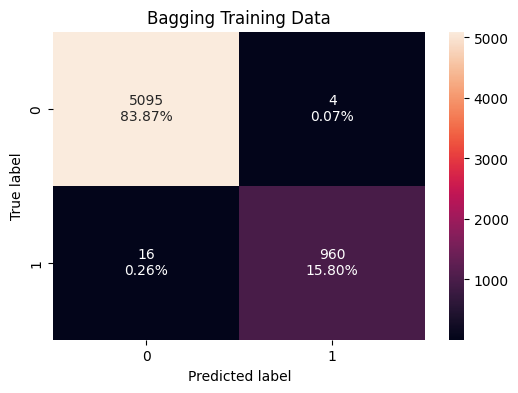

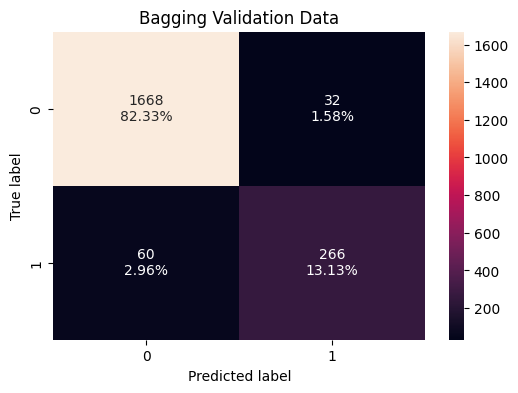

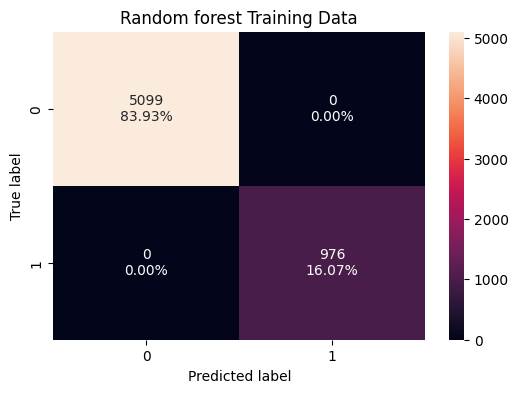

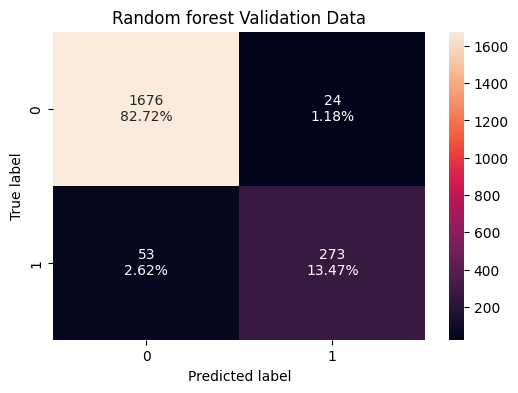

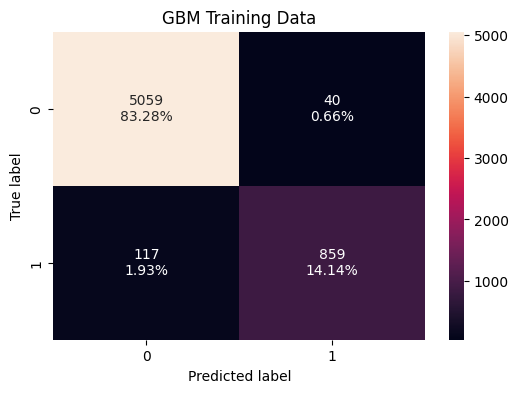

...

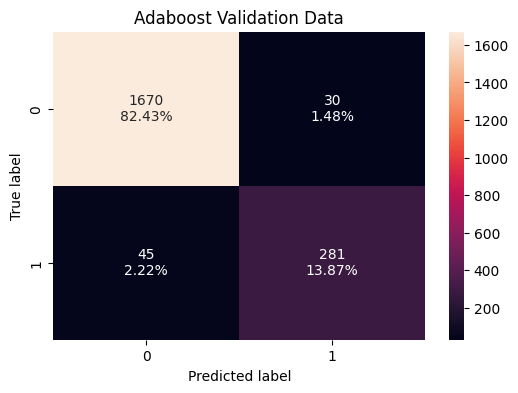

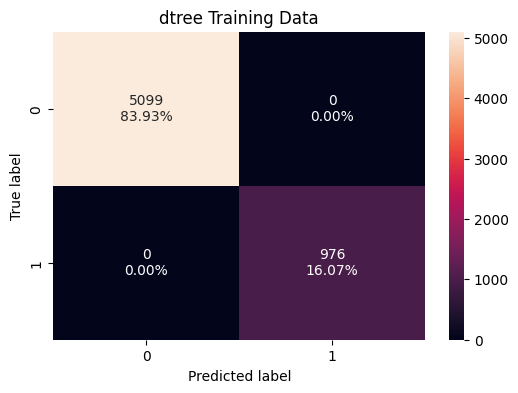

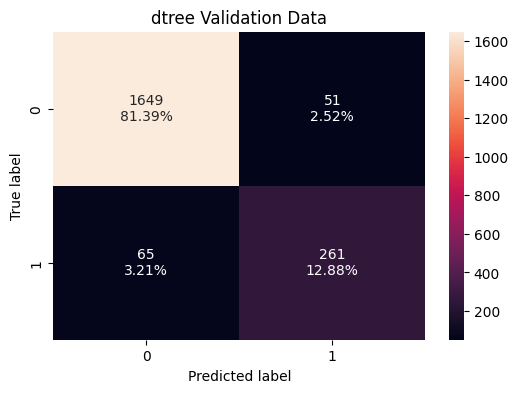

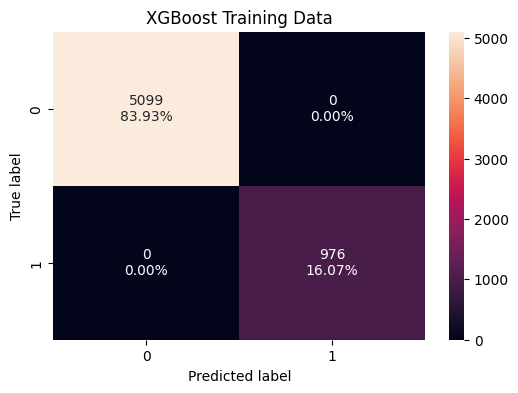

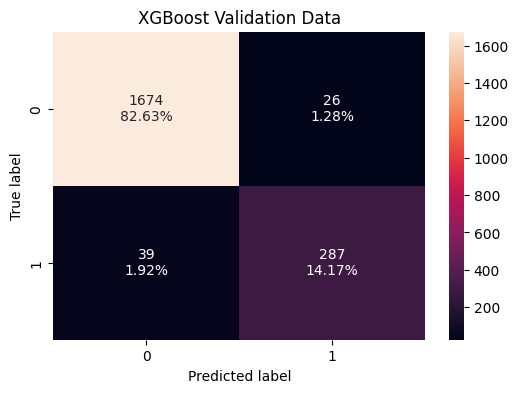

In [81]:
# Confusion matrix for original train data and validation data
for name, model in models:
  confusion_matrix_sklearn(name+" Training Data",model, X_train, y_train)
  confusion_matrix_sklearn(name+" Validation Data",model, X_val, y_val)





*   XGBoost seems to perfom well validation data with recall



### Model Building with Oversampled data


In [82]:
X_train.shape

(6075, 19)

In [83]:
# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [84]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before OverSampling, count of label '1': 976
Before OverSampling, count of label '0': 5099 

After OverSampling, count of label '1': 5099
After OverSampling, count of label '0': 5099 

After OverSampling, the shape of train_X: (10198, 19)
After OverSampling, the shape of train_y: (10198,) 



In [85]:
X_val.isna().sum()

,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0
Months_Inactive_12_mon,0


In [86]:
print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_train_over, model.predict(X_train_over))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))



Training Performance:

Bagging: 0.9978427142576975
Random forest: 1.0
GBM: 0.9794077270052951
Adaboost: 0.9652873112374976
dtree: 1.0
XGBoost: 1.0

Validation Performance:

Bagging: 0.8773006134969326
Random forest: 0.8742331288343558
GBM: 0.9171779141104295
Adaboost: 0.901840490797546
dtree: 0.8404907975460123
XGBoost: 0.9049079754601227


- GBM has the best performance followed by XGBoost model as per the validation performance

In [87]:
# train_over__perf will hold all model performance of training oversampling data
# val_over_perf will hold all model performance of validation oversampling data

train_over_perf = {}
val_over_perf = {}
print("\n","*****Training Performance Metrics*****")
for name, model in models:
   train_over_name = f"train_over_{name}"
   train_over_perf[train_over_name] = model_performance_classification_sklearn(model, X_train_over, y_train_over)

print(train_over_perf)

print("\n","****Validation Performance Metrics*******")
for name, model in models:
   val_over_name = f"val_over_{name}"
   val_over_perf[val_over_name] = model_performance_classification_sklearn(model, X_val, y_val)

print(val_over_perf)


 *****Training Performance Metrics*****
{'train_over_Bagging':    Accuracy    Recall  Precision        F1
0  0.998333  0.997843   0.998822  0.998332, 'train_over_Random forest':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0, 'train_over_GBM':    Accuracy    Recall  Precision        F1
0  0.975289  0.979408   0.971406  0.975391, 'train_over_Adaboost':    Accuracy    Recall  Precision        F1
0  0.959404  0.965287   0.954061  0.959641, 'train_over_dtree':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0, 'train_over_XGBoost':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0}

 ****Validation Performance Metrics*******
{'val_over_Bagging':    Accuracy    Recall  Precision        F1
0  0.949161  0.877301   0.819484  0.847407, 'val_over_Random forest':    Accuracy    Recall  Precision       F1
0  0.955084  0.874233   0.850746  0.86233, 'val_over_GBM':    Accuracy    Recall  Precision        F1
0   0.96002  0.917178  

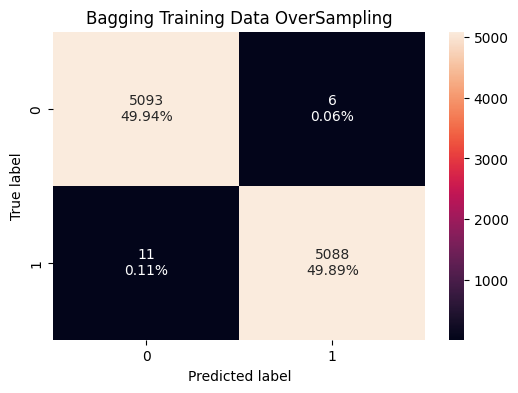

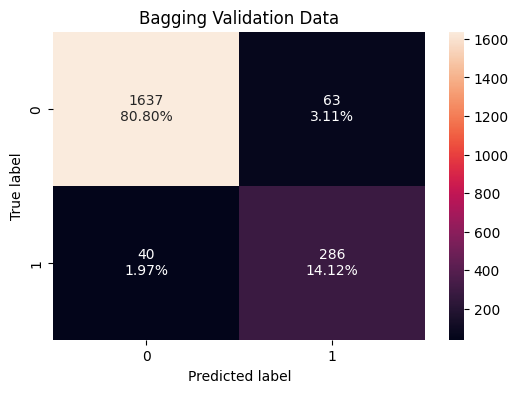

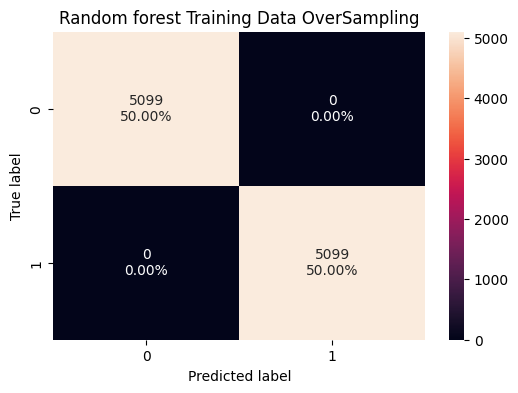

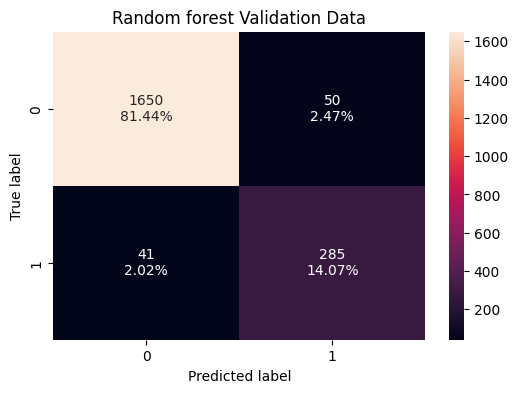

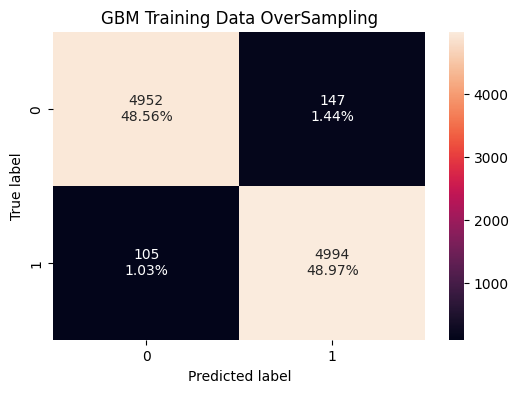

...

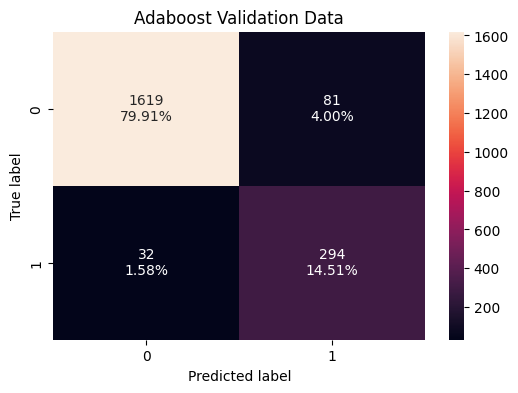

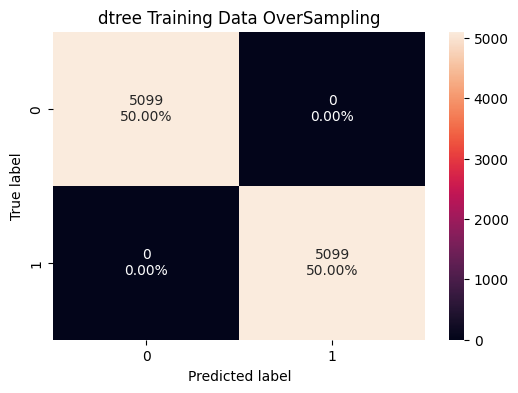

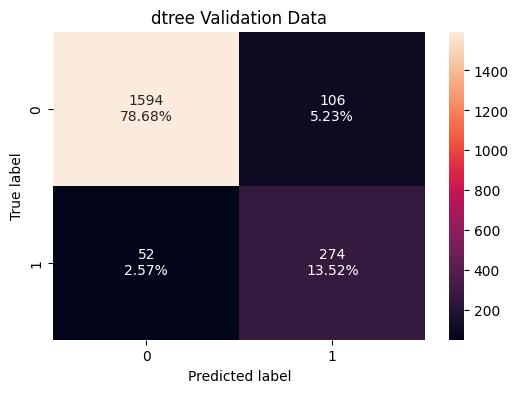

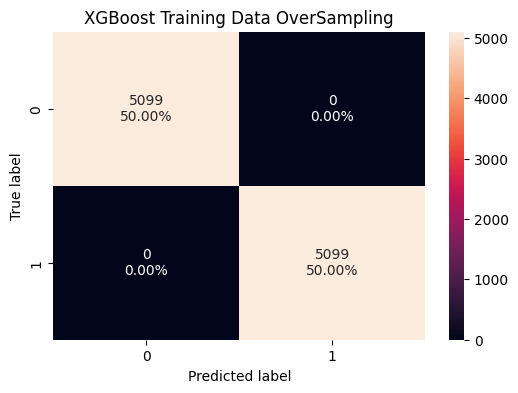

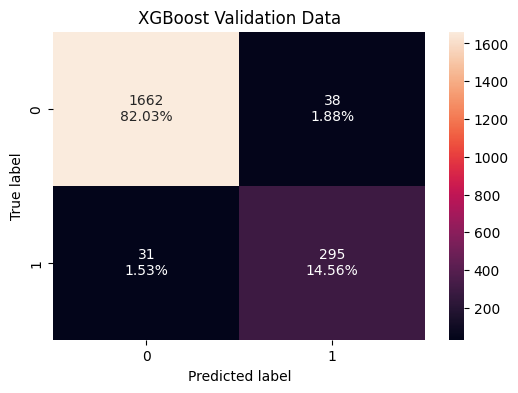

In [88]:
# Confusion matrix for OverSampled train data and validation data
for name, model in models:
  confusion_matrix_sklearn(name+" Training Data OverSampling",model, X_train_over, y_train_over)
  confusion_matrix_sklearn(name+" Validation Data",model, X_val, y_val)

### Model Building with Undersampled data

In [89]:
# Random undersampler for under sampling the data
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

In [90]:
print("Before Under Sampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before Under Sampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, count of label '1': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, count of label '0': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, count of label '1': 976
Before Under Sampling, count of label '0': 5099 

After Under Sampling, count of label '1': 976
After Under Sampling, count of label '0': 976 

After Under Sampling, the shape of train_X: (1952, 19)
After Under Sampling, the shape of train_y: (1952,) 



In [91]:
print("\n" "Training Performance:" "\n")
for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores = recall_score(y_train_un, model.predict(X_train_un))
    print("{}: {}".format(name, scores))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_un, y_train_un)
    scores_val = recall_score(y_val, model.predict(X_val))
    print("{}: {}".format(name, scores_val))


Training Performance:

Bagging: 0.9907786885245902
Random forest: 1.0
GBM: 0.9795081967213115
Adaboost: 0.9528688524590164
dtree: 1.0
XGBoost: 1.0

Validation Performance:

Bagging: 0.9263803680981595
Random forest: 0.9386503067484663
GBM: 0.9570552147239264
Adaboost: 0.9570552147239264
dtree: 0.911042944785276
XGBoost: 0.9570552147239264


- XGBoost has the best performance on validation  followed by GBM

In [92]:
# train_under__perf will hold all model performance of training undersampling data
# val_under_perf will hold all model performance of validation undersampling data

train_under_perf = {}
val_under_perf = {}
print("\n","*****Training Performance Metrics*****")
for name, model in models:
   train_under_name = f"train_under_{name}"
   train_under_perf[train_under_name] = model_performance_classification_sklearn(model, X_train_un, y_train_un)

print(train_under_perf)

print("\n","****Validation Performance Metrics*******")
for name, model in models:
   val_under_name = f"val_under_{name}"
   val_under_perf[val_under_name] = model_performance_classification_sklearn(model, X_val, y_val)

print(val_under_perf)


 *****Training Performance Metrics*****
{'train_under_Bagging':    Accuracy    Recall  Precision        F1
0  0.994877  0.990779   0.998967  0.994856, 'train_under_Random forest':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0, 'train_under_GBM':    Accuracy    Recall  Precision        F1
0  0.972848  0.979508   0.966633  0.973028, 'train_under_Adaboost':    Accuracy    Recall  Precision        F1
0  0.945697  0.952869   0.939394  0.946083, 'train_under_dtree':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0, 'train_under_XGBoost':    Accuracy  Recall  Precision   F1
0       1.0     1.0        1.0  1.0}

 ****Validation Performance Metrics*******
{'val_under_Bagging':    Accuracy   Recall  Precision        F1
0  0.926456  0.92638    0.70726  0.802125, 'val_under_Random forest':    Accuracy   Recall  Precision        F1
0  0.938302  0.93865   0.744526  0.830393, 'val_under_GBM':    Accuracy    Recall  Precision        F1
0  0.936328  0.9

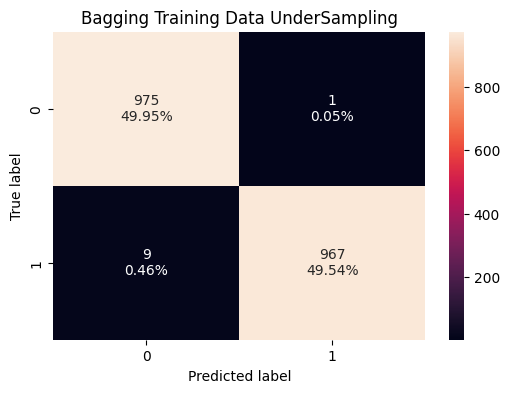

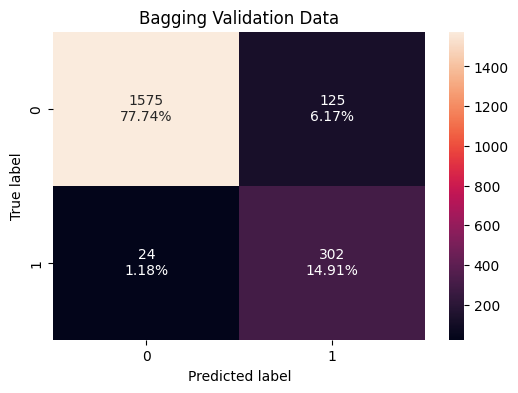

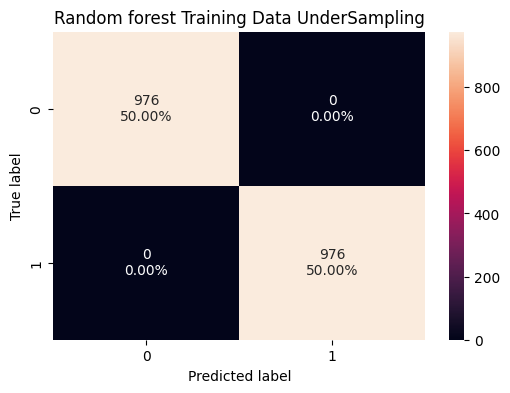

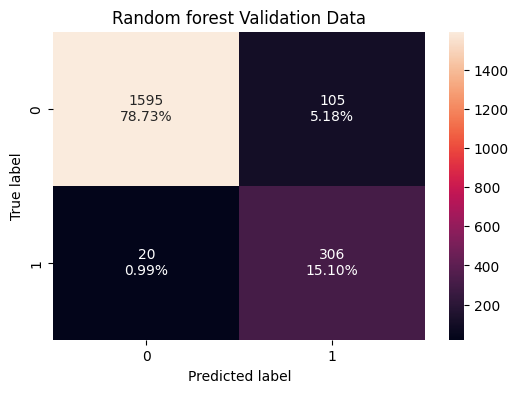

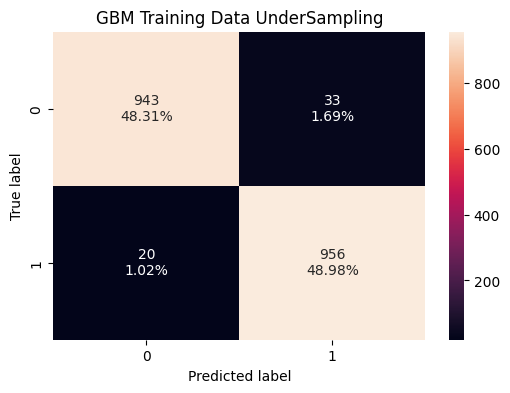

...

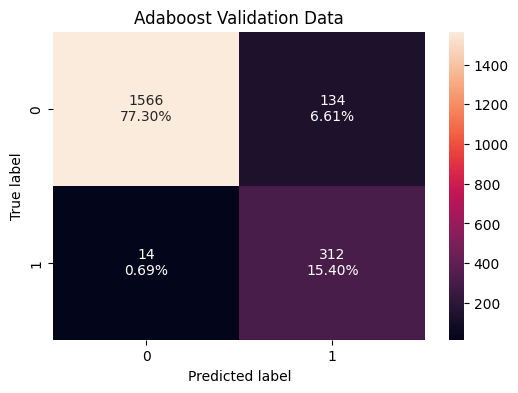

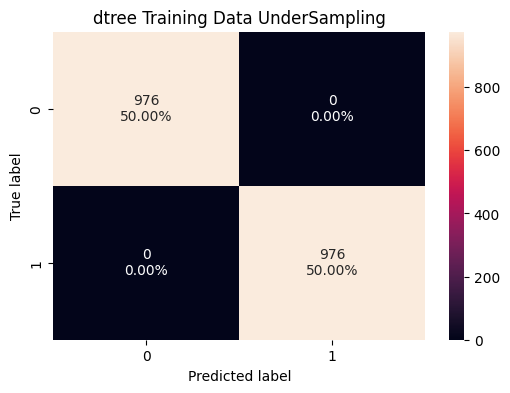

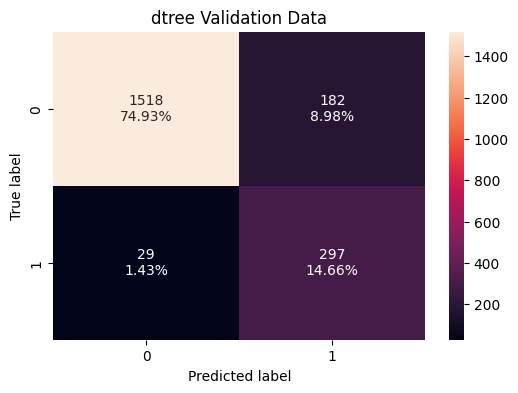

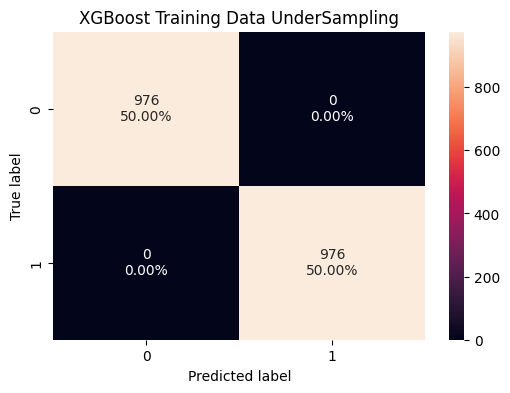

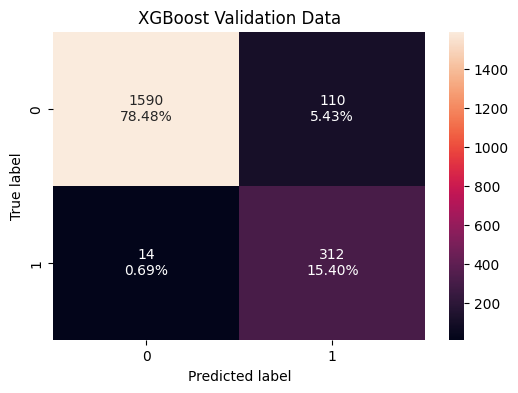

In [93]:
# Confusion matrix for UnderSampled train data and validation data
for name, model in models:
  confusion_matrix_sklearn(name+" Training Data UnderSampling",model, X_train_un, y_train_un)
  confusion_matrix_sklearn(name+" Validation Data",model, X_val, y_val)

### Find the best 3 models

In [94]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        train_perf['train_Bagging'].T,
        train_perf['train_Adaboost'].T,
        train_perf['train_Random forest'].T,
        train_perf['train_GBM'].T,
        train_perf['train_dtree'].T,
        train_perf['train_XGBoost'].T,
        train_over_perf['train_over_Bagging'].T,
        train_over_perf['train_over_Adaboost'].T,
        train_over_perf['train_over_Random forest'].T,
        train_over_perf['train_over_GBM'].T,
        train_over_perf['train_over_dtree'].T,
        train_over_perf['train_over_XGBoost'].T,
        train_under_perf['train_under_Bagging'].T,
        train_under_perf['train_under_Adaboost'].T,
        train_under_perf['train_under_Random forest'].T,
        train_under_perf['train_under_GBM'].T,
        train_under_perf['train_under_dtree'].T,
        train_under_perf['train_under_XGBoost'].T
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Bagging trained with Original data",
    "Adaboost trained with Original data",
    "Random forest trained with Original data",
    "GBM trained with Original data",
    "dtree trained with Original data",
    "XGBoost trained with Original data",
    "Bagging trained with OverSampling data",
    "Adaboost trained with OverSampling data",
    "Random forest trained with OverSampling data",
    "GBM trained with OverSampling data",
    "dtree trained with OverSampling data",
    "XGBoost trained with OverSampling data",
    "Bagging trained with UnderSampling data",
    "Adaboost trained with UnderSampling data",
    "Random forest trained with UnderSampling data",
    "GBM trained with UnderSampling data",
    "dtree trained with UnderSampling data",
    "XGBoost trained with UnderSampling data"
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Bagging trained with Original data,Adaboost trained with Original data,Random forest trained with Original data,GBM trained with Original data,dtree trained with Original data,XGBoost trained with Original data,Bagging trained with OverSampling data,Adaboost trained with OverSampling data,Random forest trained with OverSampling data,GBM trained with OverSampling data,dtree trained with OverSampling data,XGBoost trained with OverSampling data,Bagging trained with UnderSampling data,Adaboost trained with UnderSampling data,Random forest trained with UnderSampling data,GBM trained with UnderSampling data,dtree trained with UnderSampling data,XGBoost trained with UnderSampling data
Accuracy,0.996708,0.960658,1.0,0.974156,1.0,1.0,0.998333,0.959404,1.0,0.975289,1.0,1.0,0.994877,0.945697,1.0,0.972848,1.0,1.0
Recall,0.983607,0.849385,1.0,0.880123,1.0,1.0,0.997843,0.965287,1.0,0.979408,1.0,1.0,0.990779,0.952869,1.0,0.979508,1.0,1.0
Precision,0.995851,0.900109,1.0,0.955506,1.0,1.0,0.998822,0.954061,1.0,0.971406,1.0,1.0,0.998967,0.939394,1.0,0.966633,1.0,1.0
F1,0.989691,0.874012,1.0,0.916267,1.0,1.0,0.998332,0.959641,1.0,0.975391,1.0,1.0,0.994856,0.946083,1.0,0.973028,1.0,1.0


In [95]:
# validation performance comparison

models_val_comp_df = pd.concat(
    [
        val_perf['val_Bagging'].T,
        val_perf['val_Adaboost'].T,
        val_perf['val_Random forest'].T,
        val_perf['val_GBM'].T,
        val_perf['val_dtree'].T,
        val_perf['val_XGBoost'].T,
        val_over_perf['val_over_Bagging'].T,
        val_over_perf['val_over_Adaboost'].T,
        val_over_perf['val_over_Random forest'].T,
        val_over_perf['val_over_GBM'].T,
        val_over_perf['val_over_dtree'].T,
        val_over_perf['val_over_XGBoost'].T,
        val_under_perf['val_under_Bagging'].T,
        val_under_perf['val_under_Adaboost'].T,
        val_under_perf['val_under_Random forest'].T,
        val_under_perf['val_under_GBM'].T,
        val_under_perf['val_under_dtree'].T,
        val_under_perf['val_under_XGBoost'].T
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "Bagging validation performance with Original data",
    "Adaboost validation performance with Original data",
    "Random forest validation performance with Original data",
    "GBM validation performance with Original data",
    "dtree validation performance with Original data",
    "XGBoost validation performance with Original data",
    "Bagging validation performance with OverSampling data",
    "Adaboost validation performance with OverSampling data",
    "Random forest validation performance with OverSampling data",
    "GBM validation performance with OverSampling data",
    "dtree validation performance with OverSampling data",
    "XGBoost validation performance with OverSampling data",
    "Bagging validation performance with UnderSampling data",
    "Adaboost validation performance with UnderSampling data",
    "Random forest validation performance with UnderSampling data",
    "GBM validation performance with UnderSampling data",
    "dtree validation performance with UnderSampling data",
    "XGBoost validation performance with UnderSampling data"
]
print("Validation performance comparison:")
models_val_comp_df

Validation performance comparison:


,Bagging validation performance with Original data,Adaboost validation performance with Original data,Random forest validation performance with Original data,GBM validation performance with Original data,dtree validation performance with Original data,XGBoost validation performance with Original data,Bagging validation performance with OverSampling data,Adaboost validation performance with OverSampling data,Random forest validation performance with OverSampling data,GBM validation performance with OverSampling data,dtree validation performance with OverSampling data,XGBoost validation performance with OverSampling data,Bagging validation performance with UnderSampling data,Adaboost validation performance with UnderSampling data,Random forest validation performance with UnderSampling data,GBM validation performance with UnderSampling data,dtree validation performance with UnderSampling data,XGBoost validation performance with UnderSampling data
Accuracy,0.954590,0.962981,0.961994,0.968411,0.942744,0.967917,0.949161,0.944225,0.955084,0.960020,0.922014,0.965943,0.926456,0.926950,0.938302,0.936328,0.895854,0.938796
Recall,0.815951,0.861963,0.837423,0.858896,0.800613,0.880368,0.877301,0.901840,0.874233,0.917178,0.840491,0.904908,0.926380,0.957055,0.938650,0.957055,0.911043,0.957055
Precision,0.892617,0.903537,0.919192,0.939597,0.836538,0.916933,0.819484,0.784000,0.850746,0.847025,0.721053,0.885886,0.707260,0.699552,0.744526,0.730679,0.620042,0.739336
F1,0.852564,0.882261,0.876404,0.897436,0.818182,0.898279,0.847407,0.838802,0.862330,0.880707,0.776204,0.895296,0.802125,0.808290,0.830393,0.828685,0.737888,0.834225


*  Top Models are chosen based on their best recall scrore on Validation data and training data.
*  XGBoost , GBM , RandomForest With UndeSampling Data are top 3 models



### HyperparameterTuning

#### Sample Parameter Grids

**Note**

1. Sample parameter grids have been provided to do necessary hyperparameter tuning. These sample grids are expected to provide a balance between model performance improvement and execution time. One can extend/reduce the parameter grid based on execution time and system configuration.
  - Please note that if the parameter grid is extended to improve the model performance further, the execution time will increase


- For Gradient Boosting:

```
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
```

- For Adaboost:

```
param_grid = {
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
```

- For Bagging Classifier:

```
param_grid = {
    'max_samples': [0.8,0.9,1],
    'max_features': [0.7,0.8,0.9],
    'n_estimators' : [30,50,70],
}
```
- For Random Forest:

```
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}
```

- For Decision Trees:

```
param_grid = {
    'max_depth': np.arange(2,6),
    'min_samples_leaf': [1, 4, 7],
    'max_leaf_nodes' : [10, 15],
    'min_impurity_decrease': [0.0001,0.001]
}
```

- For XGBoost (optional):

```
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
```

XGBoost ,GBM and RandomForest with UnderSampling Data - Models HyperParameter Tuning

In [96]:
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#### Tuning for XGBoost with UnderSampling Data

In [97]:
# defining model
Model = XGBClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid={'n_estimators':np.arange(50,110,25),
            'scale_pos_weight':[1,2,5],
            'learning_rate':[0.01,0.1,0.05],
            'gamma':[1,3],
            'subsample':[0.7,0.9]
}
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'scale_pos_weight': 5, 'n_estimators': 100, 'learning_rate': 0.1, 'gamma': 3} with CV score=0.9774777603349033:


###### Build a model with best params

In [98]:
# defining model
xgb_tuned = XGBClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid={'n_estimators':100,
            'scale_pos_weight':5,
            'learning_rate':0.1,
            'gamma':3,
            'subsample':0.7
}

xgb_tuned.fit(X_train_un,y_train_un)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

###### Check the model performance

In [99]:
#Training data performance
xgb_train_perf = model_performance_classification_sklearn(xgb_tuned, X_train_un, y_train_un)
xgb_train_perf

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


In [100]:
#Validation Data Performance
xgb_val_perf = model_performance_classification_sklearn(xgb_tuned, X_val, y_val)
xgb_val_perf

,Accuracy,Recall,Precision,F1
0,0.938796,0.957055,0.739336,0.834225


#### Tuning for GBM with UnderSampling data

In [101]:
# defining model
Model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": [AdaBoostClassifier(random_state=1),DecisionTreeClassifier(random_state=1)],
    "n_estimators": np.arange(50,110,25),
    "learning_rate": [0.01,0.1,0.05],
    "subsample":[0.7,0.9],
    "max_features":[0.5,0.7,1],
}
#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'subsample': 0.7, 'n_estimators': 100, 'max_features': 0.7, 'learning_rate': 0.05, 'init': DecisionTreeClassifier(random_state=1)} with CV score=0.8791104133961276:


###### Build a model with best params

In [102]:
gbm_tuned = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "init": DecisionTreeClassifier(random_state=1),
    "n_estimators": 100,
    "learning_rate": 0.05,
    "subsample":0.7,
    "max_features":0.7,
}
gbm_tuned.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

###### Check the model performance

In [103]:
#Training Data Performance
gbm_train_perf=model_performance_classification_sklearn(gbm_tuned, X_train_un, y_train_un)
gbm_train_perf

,Accuracy,Recall,Precision,F1
0,0.934426,0.880123,0.987356,0.930661


In [104]:
#Validation Data Performance
gbm_val_perf = model_performance_classification_sklearn(gbm_tuned, X_val, y_val)
gbm_val_perf

,Accuracy,Recall,Precision,F1
0,0.968411,0.858896,0.939597,0.897436


#### Tuning for Random Forest with undersampled data

In [105]:
# defining model
Model = RandomForestClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": [50,110,25],
    "min_samples_leaf": np.arange(1, 4),
    "max_features": [np.arange(0.3, 0.6, 0.1),'sqrt'],
    "max_samples": np.arange(0.4, 0.7, 0.1)
}

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=Model, param_distributions=param_grid, n_iter=10, n_jobs = -1, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train_un,y_train_un)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 110, 'min_samples_leaf': 1, 'max_samples': 0.6, 'max_features': 'sqrt'} with CV score=0.9313553113553115:


In [106]:
#Tuned with Best Params
rf_tuned = RandomForestClassifier(random_state=1)

# Parameter grid to pass in RandomSearchCV
param_grid = {
    "n_estimators": 110,
    "min_samples_leaf": 1,
    "max_features": 'sqrt',
    "max_samples": 0.6
}
rf_tuned.fit(X_train_un,y_train_un)

RandomForestClassifier(random_state=1)

In [107]:
#Training Data Performance
rf_train_perf = model_performance_classification_sklearn(rf_tuned, X_train_un, y_train_un)
rf_train_perf

,Accuracy,Recall,Precision,F1
0,1.0,1.0,1.0,1.0


In [108]:
#Validation Data Performance
rf_val_perf = model_performance_classification_sklearn(rf_tuned, X_val, y_val)
rf_val_perf

,Accuracy,Recall,Precision,F1
0,0.938302,0.93865,0.744526,0.830393


## Model Comparison and Final Model Selection

In [109]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        xgb_train_perf.T,
        gbm_train_perf.T,
        rf_train_perf.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "XGBoost boosting trained with Undersampled data",
    "Gradient boosting trained with Undersampled data",
    "Random Forest trained with Undersampled data",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,XGBoost boosting trained with Undersampled data,Gradient boosting trained with Undersampled data,Random Forest trained with Undersampled data
Accuracy,1.0,0.934426,1.0
Recall,1.0,0.880123,1.0
Precision,1.0,0.987356,1.0
F1,1.0,0.930661,1.0


In [110]:
# validation performance comparison

models_val_comp_df = pd.concat(
    [
        xgb_val_perf.T,
        gbm_val_perf.T,
        rf_val_perf.T,
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "XGBoost boosting validation performance with Undersampled data",
    "Gradient boosting validation performance with Undersampled data",
    "Random Forest validation performance with Undersampled data",
]
print("Training performance comparison:")
models_val_comp_df

Training performance comparison:


,XGBoost boosting validation performance with Undersampled data,Gradient boosting validation performance with Undersampled data,Random Forest validation performance with Undersampled data
Accuracy,0.938796,0.968411,0.938302
Recall,0.957055,0.858896,0.938650
Precision,0.739336,0.939597,0.744526
F1,0.834225,0.897436,0.830393


- XGBoost model trained with undersampled data has generalised performance, so let's consider it as the best model.

### Test set final performance

In [111]:
# Let's check the performance on test set
xgb_test = model_performance_classification_sklearn(xgb_tuned, X_test, y_test)
xgb_test

,Accuracy,Recall,Precision,F1
0,0.942251,0.966154,0.747619,0.842953


- The XGBoost boosting model trained on undersampled data has given 96% recall on the test set
- This performance is in line with what we achieved with this model on the train and validation sets
- So, this is a generalized model

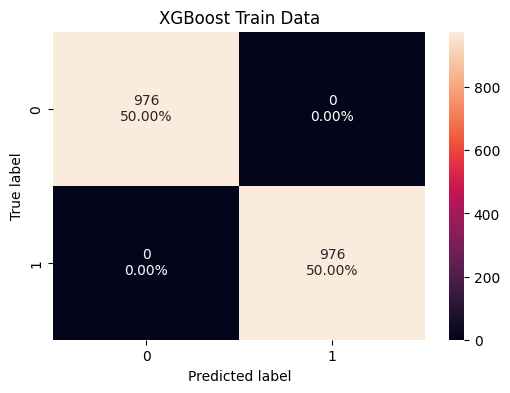

In [112]:
confusion_matrix_sklearn("XGBoost Train Data",xgb_tuned, X_train_un, y_train_un)

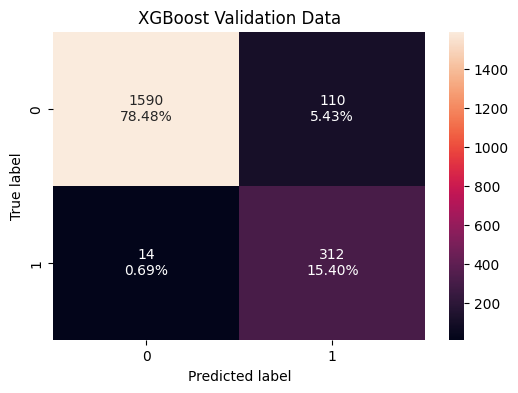

In [113]:
confusion_matrix_sklearn("XGBoost Validation Data",xgb_tuned, X_val, y_val)

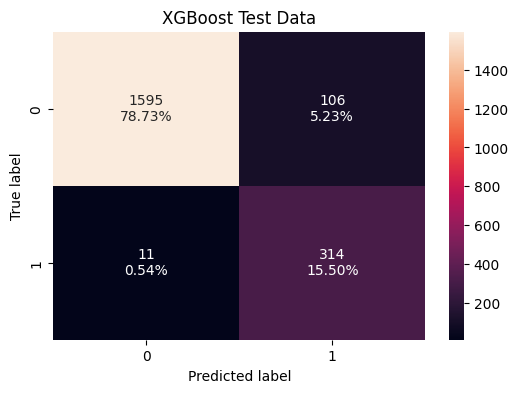

In [114]:
confusion_matrix_sklearn("XGBoost Test Data",xgb_tuned, X_test, y_test)

#### Feature Performance

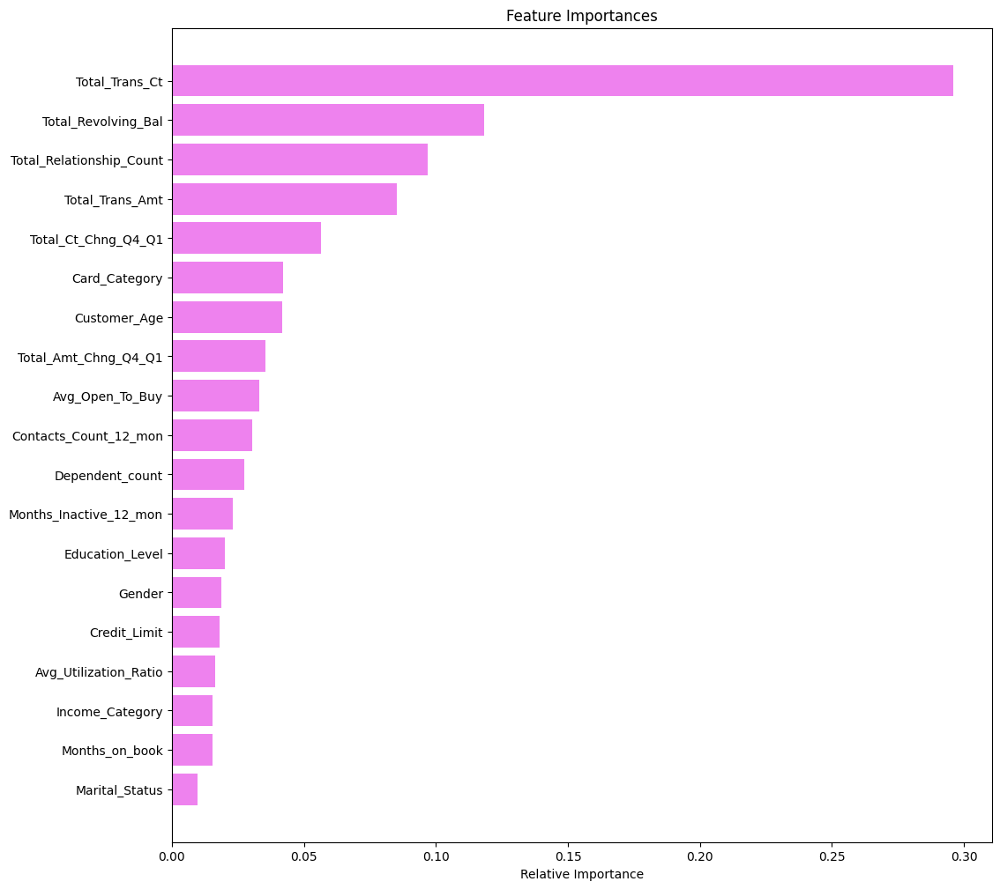

In [115]:
feature_names = X_train.columns
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

- We can see that Total_Trans_ct, Total_Revolving_Bal,Total_Relationship_count are the top 3 most important features for making predictions

# Business Insights and Conclusions

* Customers with high transaction ct in the last 12 months are less likely yo churn than users with less total transaction count
*   Customers with high revolving balance are less likely yo churn
*   Customers who have more products are less likely to churn and have stronger relationship with the bank. Total_Relationship_count is one of the top 3 predictor of credit card users churn.
* Customers with higher transaction count are less likely to churn
* Higher change in transaction count Q4 over Q1 indicates customer is less likely to churn
* Bank to promote special programs for Female credit card users as the attrition rate seems to be little higher in Females than Males



***